###### Introduction

<b>Read this is you're new here</b>

This is a very confusing and all over the place document. Here's a few notes to make sure it ends up better than I originally planned. 

- <b>Independence:</b> Each section should be executable without the need for other sections, ideally. If you need a function, write it and put it in the function section. There, make the cell an 'initialization cell' (in <tt>View -> Initialization cells</tt>, then check the box)
- <b>Speed:</b> If the cell performs large data analysis (> 10 mins or something), try and save the data as well (if you're processing an array). Then, make the cell allow for loading that data, to save yourself time in the future.  
- <b>Save stuff: </b> I really wanted to have this as a workplace only, but it quickly grew much bigger than that. The problem is that the file becomes very very large, which makes this fairly slow. I'd say, try to save sections or parts of the code in individual python scripts, ready to be executed. 




In [2]:
# To hide all the code
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

# Intro

This is a quick script for the development of the spin dependent OAH analysis. 

## Imports And Constants

In [12]:
import astropy.io.fits as pyfits
import numpy as np
import matplotlib.pyplot as plt
import os
from matplotlib.widgets import Slider
from matplotlib import colors
from matplotlib.gridspec import GridSpec
from IPython.display import clear_output
import scipy.odr as odr
import imageio
import gc
from matplotlib.widgets import EllipseSelector, RectangleSelector
from matplotlib.pyplot import cm
from scipy.special import eval_legendre
from scipy.optimize import curve_fit
import scipy.fftpack as fft
from matplotlib.colors import LogNorm
import csv

from OAH_refocus import *
import time
import sys
import argparse
import glob
import csv
import matplotlib
import math
from scipy.optimize import curve_fit
from fitfunctions import gaussmod, tfmod, bimodalmod, tfaxialmod, gaussmod_OAH, tfmod_OAH, bimodalmod_OAH
from scipy.ndimage.interpolation import rotate
from scipy.special import zeta


# Import own fit functions
import OAH_functions as f1
# import OAHDEV_functions as f2
from OAHDEV_functions import *
# from ..data_analysis import fits_analysis as fa


# Constants:
kB = 1.38064852E-23
m = 3.81923979E-26
hb = 1.0545718E-34
asc = 2.802642E-9
mu0 = 1E-50
e0 = 8.854187E-12
pix_size = 6.5E-6 / 2.63
# Light field properties
lamb0 = 589.1E-9  # Wavelength
k0 = 2 * np.pi / lamb0  # k-vector

plt.style.use('fivethirtyeight')  # pretty cool looking 
%matplotlib notebook

<ipython-input-12-2c00f1a14131>:30: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  from scipy.ndimage.interpolation import rotate


In [13]:
border_x = 5
border_z = 50

# Cutout
# ((xmin, xmax), (zmin, zmax)) = ((400, -200), (400, -200))
# ((xmin, xmax), (zmin, zmax)) = ((1000, 1400), (1000, 1400))
((xmin, xmax), (zmin, zmax)) = ((1, -1), (1, -1))
# ((xmin, xmax), (zmin, zmax)) = ((350, -350), (250, -250))

In [14]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

## Functions

### SOAH Functions

In [15]:
def OAH_full_process(date, shot, num, dz_focus, quad_cut, mask_w=0.51, multi_loop=0, peakswithfitting=False):
    multi_loop  = 0
    el_x        = 10
    el_z        = 100
    edge_x      = 10
    edge_z      = 80
    e_w         = 0.1

    # ---------------------------------------------------------------------------------------------------
    # ------------------------------ OAH ENTIRE PROCESSING FUNCTION -------------------------------------
    # ---------------------------------------------------------------------------------------------------

    # ------------------------------------- OPEN FILES --------------------------------------------------
    atoms, flat, dark = openFiles(date, shot, num, multi_loop=multi_loop)

    # ----------------------------------- MASK THE EDGE -------------------------------------------------
    atoms      = f1.squaroid(atoms - dark, width=mask_w)
    flat       = f1.squaroid(flat - dark, width=mask_w)
#     atoms      = f1.ellipsoid(atoms - dark, width=mask_w, type="tukey")
#     flat       = f1.ellipsoid(flat - dark, width=mask_w, type="tukey")

    
    # ------------------------------------- TAKE FFT ----------------------------------------------------
    fft_atoms = np.fft.fft2(atoms)
    fft_flat = np.fft.fft2(flat)

    # ----------------------------------- TRIM THE EDGE -------------------------------------------------
    fft_atoms = fft_atoms[5:-5, 5:-5]
    fft_flat = fft_flat[5:-5, 5:-5]

    # ---------------------------- CUT QUADRANT AND MAKE ELLIPSOID  -------------------------------------
    quad1, q1peak  = f1.box_cutter_pad_ellips(fft_atoms, quad_cut, el_x, el_z, 
                                              edge_x=edge_x, edge_z=edge_z, e_w=e_w, 
                                              peakswithfitting=peakswithfitting)
    flatq1, f1peak = f1.box_cutter_pad_ellips(fft_flat,  quad_cut, indices=q1peak) # same indices as for quad
    quad1cut, flatq1cut = f1.sizecomp(quad1, flatq1)

    # ---------------------------------- SHIFT FFT TO CENTER  -------------------------------------------
    fft1 = np.fft.fftshift(quad1cut)
    flatfft1 = np.fft.fftshift(flatq1cut)
    
#     fft1 = quad1cut
#     flatfft1 = flatq1cut

    # -------------------------------------- REFOCUSING --------------------------------------------------
    fft_kx = np.fft.fftfreq(fft1.shape[1], d=pix_size)  # Discrete FFT Sample Frequency in x
    fft_ky = np.fft.fftfreq(fft1.shape[0], d=pix_size)  # Discrete FFT Sample Frequency in z
    fft_k2 = fft_kx[None, :] ** 2 + fft_ky[:, None] ** 2  # Discrete FFT Sample Frequency in main axes multiplied
    ly = 0  # .5E6#-3E6#.                                           # Adjusting the fft_ky array
    coma_y_arg = ly * fft_ky[:, None] * (3 * fft_k2 / k0 ** 2) / k0
    lin_y = np.exp(-1j * coma_y_arg)
    focus = np.exp(-1j * dz_focus * np.sqrt(k0 **2 - fft_k2))
    fft1 = fft1 * focus * lin_y
    flatfft1 = flatfft1 * focus * lin_y

    # ------------------------------------- INVERSE FFT -------------------------------------------------
    inv1 = np.fft.ifft2(fft1) / np.fft.ifft2(flatfft1)
    inv1 = inv1[border_x:-border_x, border_z:-border_z]

    # Get Phase
    ang1 = np.angle(inv1)
    ang1 = f1.unwrapper(ang1)

    # Get amp
    amp = np.abs(inv1)
    amp = np.log(amp**2)

    # Normalize
    normfactor = ang1.mean()
    ang1 = ang1 - normfactor
    ang1 = normalize(ang1)[0] 
    
    return atoms, flat, ang1, amp

In [16]:
def normalize(ang):
    """
    Returns the normalized image of the cloud - it fits each horizontal line of the image with a simple linear fit.
    Then it performs the vertical linear fit. This way, we get the background image, which we subtract from the actual image.
    It seems however that we might even have some quadratic, or maybe a gaussian would be easier? 
    """
    def linear_f(x, a, b):
        """ Faster, but does poor job. """
        return a * x + b
    
    def quadratic_f(x, a, b, c):
        """ Slower, but better equiped for normalizing"""
        return a * x**2 + b*x + c
    

    xdata = np.arange(0, len(ang[0]))
    ydata = np.arange(0, len(ang))
    arr_gradient = []
    arr_gradient_2 = []
    # Linear fit - horizontal gradient (for each line individualy)
    for i in range(ang.shape[0]):
        pars, cov = curve_fit(f=quadratic_f, xdata=xdata, ydata=ang[i], p0=[0, 0, 0])
        arr_line = quadratic_f(xdata, pars[0], pars[1], pars[2])
        arr_gradient.append(arr_line)
    lingrad = arr_gradient.copy()
    
    # Linear fit - vertical gradient (for each line individualy)
    arr_gradient = np.transpose(arr_gradient)  # Transpose
    for i in range(ang.shape[1]):
        pars, cov = curve_fit(f=quadratic_f, xdata=ydata, ydata=arr_gradient[i], p0=[0, 0, 0])
        arr_line = quadratic_f(ydata, pars[0], pars[1], pars[2])
        arr_gradient_2.append(arr_line)
    arr_gradient = np.transpose(arr_gradient_2)  # Transpose back
    
    ang = ang - arr_gradient
    return ang, arr_gradient, lingrad

In [17]:
def select_coords(pic, title_string=None):
    """ 
        A function to make a range selection a piece of cake. Plots the image (which is taken as an input).
        it is actually still a pain in the ass. It works in principle, but it's very annoying to implement it. 
    """
    def select_callback(eclick, erelease):
        """
        Callback for line selection.

        *eclick* and *erelease* are the press and release events.
        """
        global xtemp1, xtemp2, ytemp1, ytemp2
        xtemp1, ytemp1 = eclick.xdata, eclick.ydata
        xtemp2, ytemp2 = erelease.xdata, erelease.ydata
        title.set_text("Coordinates Recorded: \n X = {:} - {:}, Y = {:} - {:} \nPress Enter to save.".format(round(xtemp1),round(xtemp2),round(ytemp1),round(ytemp2)))
        fig.canvas.draw_idle()

    def toggle_selector(event):
        print('Key pressed.')
        if event.key == 't':
            for selector in selectors:
                name = type(selector).__name__
                if selector.active:
                    print(f'{name} deactivated.')
                    selector.set_active(False)
                else:
                    print(f'{name} activated.')
                    selector.set_active(True)
        elif event.key == 'enter':
            # print("Enter pressed")
            plt.close()
            t_var = True
    
    t_var = False
    fig, ax = plt.subplots()
    ax.imshow(pic)
    

    N = 100000  # If N is large one can see improvement by using blitting.
    x = np.linspace(0, 10, N)

    selectors = []
    for selector_class in [RectangleSelector]:
        selectors.append(selector_class(
            ax, select_callback,
            useblit=True,
            button=[1, 3],  # disable middle button
            minspanx=5, minspany=5,
            spancoords='pixels',
            interactive=True))
        fig.canvas.mpl_connect('key_press_event', toggle_selector)

    if title_string is None:
        title = ax.set_title("Make a selection and \n press Enter to save the coordinates.")
    else: 
        title = ax.set_title("{:} and \n press Enter to save the coordinates.".format(title_string))

    fig.canvas.draw_idle()

    return xtemp1, xtemp2, ytemp1, ytemp2

        

def wrapper(pic):
    xtemp1, xtemp2, ytemp1, ytemp2 = select_coords(pic)
    return xtemp1, xtemp2, ytemp1, ytemp2

In [18]:
# Initial values
initial_fit_vals = {
    "offset": 0.,
    "amp_ov": 1.,
    "ang": 0,
    "center": (50, 850),
    "tfa": 1,
    "tfw": (20, 50),
    "ga": 1,
    "gw": (200, 200),
    "j_guess": 40 ,
    "axamp": 1,
    "x_shift": 0.0,
    "squeeze_par": 1.0,
}

In [19]:
def fitting(pic, mode, init_guess=initial_fit_vals, normalize=False, invert=False, OAH=False):
    
    # Initial values
    offset = init_guess["offset"]
    amp_ov = init_guess["amp_ov"]
    ang = init_guess["ang"]
    center = init_guess["center"]
    tfa = init_guess["tfa"]
    tfw = init_guess["tfw"]    
    ga = init_guess["ga"]
    gw = init_guess["gw"]    
    j_guess = init_guess["j_guess"]
    axamp = init_guess["axamp"]    
    x_shift = init_guess["x_shift"]
    squeeze_par = init_guess["squeeze_par"]
    
#     print(init_guess)
    
    
    # Normalize everything between 1 and 0
    if normalize:
#         pic = pic[10:-10, 10:-10]
        pic = pic + abs(pic.min()) + 0.00001
        avg_bg = pic.mean()
        pic = pic/avg_bg

    if invert:
        # Normalize such that the background is at 1, the peak is at zero.         
        pic= - pic + 0.5

        
    mask = pic == 0
    pic = np.ma.array(pic, mask=mask)
    # Generate empty arrays of the pic size which we will feed into the fitting procedure.
    # Create a 'fitvars' array of x and y coordinates
    x = np.arange(pic.shape[0])
    y = np.arange(pic.shape[1])
    xv, yv = np.meshgrid(x, y, indexing='ij')
    fitvars = np.array([xv, yv]).reshape(2, -1)

    xbin = 1
    zbin = 1

    # Constants
    pixelsize = 2.47148288973384e-06 
    kB = 1.38064852E-23
    m = 3.81923979E-26
    hb = 1.0545718E-34
    asc = 2.802642E-9
    mu0 = 1e-50
    e0 = 8.854187E-12
    fx = 115
    fz = 15
    wavelength = 589e-9
    detuning = 0
    prefactor = float((1 + 4 * detuning ** 2) * 2 * np.pi / (3 * (wavelength ** 2)) * 18. / 5.)

    xmin, xmax, zmin, zmax = 0, 0, 0, 0
    
    par_names = ['offset', 'ampl', 'ang', 'xmid', 'ymid', 'tfamp', 'tfxw', 'tfyw', 'gamp', 'gxw', 'gyw']
    bin_scaling = np.array([1., 1., 1., xbin, zbin, 1., xbin, zbin, 1., xbin, zbin])
    rng_offset = np.array([0., 0., 0., xmin, zmin, 0., 0., 0., 0., 0., 0.])
    init_guess = np.array([offset, amp_ov, ang, center[0], center[1], tfa, tfw[0], tfw[1], ga, gw[0], gw[1]])
    to_physical = np.array([1., 1., 1., pixelsize, pixelsize, prefactor, pixelsize, pixelsize, prefactor, pixelsize, pixelsize])
    corr_guess = (init_guess - rng_offset) / bin_scaling

    if OAH:
        if mode == "gauss":
            corr_guess = np.append(corr_guess[:5], corr_guess[-3:])
            bin_scaling = np.append(bin_scaling[:5], bin_scaling[-3:])
            rng_offset = np.append(rng_offset[:5], rng_offset[-3:])
            par_names = np.append(par_names[:5], par_names[-3:])
            to_physical = np.append(to_physical[:5], to_physical[-3:])
            odrmodel = odr.Model(gaussmod_OAH)  # Store information for the gaussian fitting model

        if mode == "doubletf":
            corr_guess = np.append(corr_guess[:8], [center2[0], center2[1], tfa2, tfw2[0], tfw2[1]])
            bin_scaling = np.append(bin_scaling[:8], bin_scaling[3:8])
            rng_offset = np.append(rng_offset[:8], rng_offset[3:8])
            par_names = np.append(par_names[:8], par_names[3:8])
            to_physical = np.append(to_physical[:8], to_physical[3:8])
            odrmodel = odr.Model(double_tf_OAH)  # Store information for the gaussian fitting model

            
        if mode == "tf":
            corr_guess = corr_guess[:8]
            bin_scaling = bin_scaling[:8]
            rng_offset = rng_offset[:8]
            par_names = par_names[:8]
            to_physical = to_physical[:8]
            odrmodel = odr.Model(tfmod_OAH)  # Store information for the tf fitting model

        if mode == "bimodal":
            odrmodel = odr.Model(bimodalmod_OAH)  # Store information for the bimodal fitting model
            
        
    else: 
        if mode == "gauss":
            corr_guess = np.append(corr_guess[:5], corr_guess[-3:])
            bin_scaling = np.append(bin_scaling[:5], bin_scaling[-3:])
            rng_offset = np.append(rng_offset[:5], rng_offset[-3:])
            par_names = np.append(par_names[:5], par_names[-3:])
            to_physical = np.append(to_physical[:5], to_physical[-3:])
            odrmodel = odr.Model(gaussmod)  # Store information for the gaussian fitting model

        if mode == "tf":
            corr_guess = corr_guess[:8]
            bin_scaling = bin_scaling[:8]
            rng_offset = rng_offset[:8]
            par_names = par_names[:8]
            to_physical = to_physical[:8]
            odrmodel = odr.Model(tfmod)  # Store information for the tf fitting model

        if mode == "bimodal":
            odrmodel = odr.Model(bimodalmod)  # Store information for the bimodal fitting model

        if mode == "timecrystal":
            corr_guess = corr_guess[:8]
            corr_guess = np.append(corr_guess, j_guess)
            corr_guess = np.append(corr_guess, axamp)
            corr_guess = np.append(corr_guess, x_shift)
            corr_guess = np.append(corr_guess, squeeze_par)
            bin_scaling = bin_scaling[:8]
            bin_scaling = np.append(bin_scaling, 1.)
            bin_scaling = np.append(bin_scaling, 1.)
            bin_scaling = np.append(bin_scaling, 1.)
            bin_scaling = np.append(bin_scaling, 1.)
            rng_offset = rng_offset[:8]
            rng_offset = np.append(rng_offset, 0)
            rng_offset = np.append(rng_offset, 0)
            rng_offset = np.append(rng_offset, 0)
            rng_offset = np.append(rng_offset, 0)
            par_names = par_names[:8]
            par_names = np.append(par_names, "j parameter")
            par_names = np.append(par_names, "axamp")
            par_names = np.append(par_names, "x_shift")
            par_names = np.append(par_names, "squeeze_par")
            to_physical = to_physical[:8]
            to_physical = np.append(to_physical, 1.)
            to_physical = np.append(to_physical, 1.)
            to_physical = np.append(to_physical, 1.)
            to_physical = np.append(to_physical, 1.)
            odrmodel = odr.Model(tfaxialmod)
        
       
    print(corr_guess)
    # Run the ODR Fit procedure.
    odrdata = odr.Data(fitvars[:, ~pic.mask.flatten()], pic.flatten()[~pic.mask.flatten()])
    odrobj = odr.ODR(odrdata, odrmodel, beta0=corr_guess)
    odrobj.set_job(2)  # Ordinary least-sqaures fitting
    odrout = odrobj.run()
#     odrout.pprint()


    if OAH:
        # This sets the angle to be correct wrt x and y.
        if np.abs(odrout.beta[2] % np.pi) > np.pi / 4.:
            odrout.beta[2] = odrout.beta[2] - np.pi / 2.
            print("Performing xy swap due to angle.")
            if mode == "bimodal":
                tmp_tfx = odrout.beta[6]
                tmp_gx = odrout.beta[-2]
                odrout.beta[6] = odrout.beta[7]
                odrout.beta[7] = tmp_tfx
                odrout.beta[-2] = odrout.beta[-1]
                odrout.beta[-1] = tmp_gx
            else:
                tmp = odrout.beta[6]
                odrout.beta[6] = odrout.beta[7]
                odrout.beta[7] = tmp

        if mode == "gauss":
            fitresult = gaussmod_OAH(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = gaussmod_OAH(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []
        
        if mode == "doubletf":
            fitresult = double_tf_OAH(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = double_tf_OAH(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []

        if mode == "tf":
            fitresult = tfmod_OAH(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = tfmod_OAH(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []

        if mode == "bimodal":
            fitresult = bimodalmod_OAH(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresulttf = tfmod_OAH(odrout.beta[:8], fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = gaussmod_OAH(np.append(odrout.beta[:5], odrout.beta[-3:]), fitvars).reshape(pic.shape[0],pic.shape[1])
            fitguess = bimodalmod_OAH(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
        
    else:
        # This sets the angle to be correct wrt x and y.
        if np.abs(odrout.beta[2] % np.pi) > np.pi / 4.:
            odrout.beta[2] = odrout.beta[2] - np.pi / 2.
            print("Performing xy swap due to angle.")
            if mode == "bimodal":
                tmp_tfx = odrout.beta[6]
                tmp_gx = odrout.beta[-2]
                odrout.beta[6] = odrout.beta[7]
                odrout.beta[7] = tmp_tfx
                odrout.beta[-2] = odrout.beta[-1]
                odrout.beta[-1] = tmp_gx
            else:
                tmp = odrout.beta[6]
                odrout.beta[6] = odrout.beta[7]
                odrout.beta[7] = tmp

        if mode == "gauss":
            fitresult = gaussmod(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = gaussmod(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []
            
        if mode == "tf":
            fitresult = tfmod(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = tfmod(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []

        if mode == "bimodal":
            fitresult = bimodalmod(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresulttf = tfmod(odrout.beta[:8], fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = gaussmod(np.append(odrout.beta[:5], odrout.beta[-3:]), fitvars).reshape(pic.shape[0],pic.shape[1])
            fitguess = bimodalmod(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])

        if mode == "timecrystal":
            fitresult = tfaxialmod(odrout.beta, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitguess = tfaxialmod(corr_guess, fitvars).reshape(pic.shape[0], pic.shape[1])
            fitresultgauss = []
            fitresulttf = []
        
#     print("The shape of the pic file: \n{:}\n".format(pic.shape))
#     print("The guess parameters: \n{:}\n".format(corr_guess))
#     print("Odrout: \n{:}\n".format(odrout.beta))

    # As the entire output, except for the angle and the offset, has to be positive,
    # we take the absolute value of the entire list, then put the angle and offset back in.
    offset_temp = odrout.beta[0]
    ang_temp = odrout.beta[2]
    odrout.beta = np.abs(odrout.beta)
    odrout.beta[0] = offset_temp
    odrout.beta[2] = ang_temp % np.pi
    
    # Converts the fit results to absolute pixel values in the unbinned image.
    fit_results = odrout.beta * bin_scaling + rng_offset
    phys_results = fit_results * to_physical

    tof = 0
    ncount = - np.log(pic.flatten()).sum() * prefactor * pixelsize ** 2 * xbin * zbin
    ntherm = 0
    ntf = 0
    tx = 0
    tz = 0
    mux = 0
    muz = 0
    mun = 0

    if mode == "gauss":
        ntherm = 2 * np.pi * phys_results[5] * phys_results[6] * phys_results[7]
        tx = 1 / kB * m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        tz = 1 / kB * m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mux = m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        muz = m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mun = 1.47708846953 * np.power(
            ntf * asc / (np.sqrt(hb / (m * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)))),
            2. / 5.) * hb * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)
    if mode == "tf":
        ntf = 2. * np.pi / 5. * phys_results[5] * phys_results[6] * phys_results[7]  # 2/5 = 8/15 / (4/3)
        tx = 1 / kB * m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        tz = 1 / kB * m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mux = m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        muz = m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mun = 1.47708846953 * np.power(
            ntf * asc / (np.sqrt(hb / (m * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)))),
            2. / 5.) * hb * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)
    if mode == "timecrystal":
        ntf = 2. * np.pi / 5. * phys_results[5] * phys_results[6] * phys_results[7]  # 2/5 = 8/15 / (4/3)
        tx = 1 / kB * m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        tz = 1 / kB * m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mux = m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        muz = m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mun = 1.47708846953 * np.power(
            ntf * asc / (np.sqrt(hb / (m * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)))),
            2. / 5.) * hb * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)
    if mode == "bimodal":
        ntf = 2. * np.pi / 5. * phys_results[5] * phys_results[6] * phys_results[7]
        ntherm = 2 * np.pi * phys_results[8] * phys_results[9] * phys_results[10]
        tx = 1 / kB * m / 1 * (fx * np.pi * 2 * phys_results[9]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        tz = 1 / kB * m / 1 * (fz * np.pi * 2 * phys_results[10]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mux = m / 1 * (fx * np.pi * 2 * phys_results[6]) ** 2 / (1 + (tof * fx * np.pi * 2) ** 2)
        muz = m / 1 * (fz * np.pi * 2 * phys_results[7]) ** 2 / (1 + (tof * fz * np.pi * 2) ** 2)
        mun = 1.47708846953 * np.power(
            ntf * asc / (np.sqrt(hb / (m * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)))),
            2. / 5.) * hb * np.power(8 * np.pi ** 3 * fx ** 2 * fz, 1. / 3.)

    ntotal = ntherm + ntf

    fitted_vars = (ncount, ntherm, ntf, tx, tz, mux, muz, mun)
    
    return pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout



In [20]:
# Fit and Rotate
###### ------------ ROTATE ---------------- 
# Since the condensates are pretty thin in the ODT, let's rotate them as well, so a linecut will be nicer. 
# Additionally, we will also be able to compare the fits themself. Fitting with TF model. 

def rotateFunction(ang1, ang2, mode="tf"):
    """
        We do it together for both, so that we also make sure that they are of
        the same size. Which we need for fitting. 
    """
    tfw = (ang1.shape[0]//5, ang1.shape[1]//2)
    gw = (ang1.shape[0]//5, ang1.shape[1]//2)
    fit_1 = fitting(ang1, init_guess=initial_g_1, mode="tf", OAH=True)
    fit_2 = fitting(ang2, init_guess=initial_g_2, mode="tf", OAH=True)
    # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
    clear_output()

    print(f"Angle 1 = {fit_1[6].beta[2]*(180/np.pi)}")
    print(f"Angle 2 = {fit_2[6].beta[2]*(180/np.pi)}")
    print(fit_1[6].beta)
    
    # Rotating the image and also the fitresult
#     ang1_rot = rotate(fit_1[0], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
#     ang2_rot = rotate(fit_2[0], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    ang1_rot = rotate(ang1, (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    ang2_rot = rotate(ang2, (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult1_rot = rotate(fit_1[1], (fit_1[6].beta[2]*(180/np.pi)), mode='reflect')
    fitresult2_rot = rotate(fit_2[1], (fit_2[6].beta[2]*(180/np.pi)), mode='reflect')

    # If 90 degrees off: 
    if ang1_rot.shape[0] > ang1_rot.shape[1]:
        ang1_rot = np.transpose(np.transpose(np.transpose(ang1_rot)))
        fitresult1_rot = np.transpose(np.transpose(np.transpose(fitresult1_rot)))

    if ang2_rot.shape[0] > ang2_rot.shape[1]:
        ang2_rot = np.transpose(np.transpose(np.transpose(ang2_rot)))
        fitresult2_rot = np.transpose(np.transpose(np.transpose(fitresult2_rot)))

    # Also, let's minus the offset on all of them:
    ang1_rot -= fit_1[6].beta[0]
    ang2_rot -= fit_2[6].beta[0]

    fitresult1_rot -= fit_1[6].beta[0]
    fitresult2_rot -= fit_2[6].beta[0]
    
    
    # make sure ang1_rot and ang2_rot are the same size:
    xedge = min(ang1_rot.shape[0], ang2_rot.shape[0])
    yedge = min(ang1_rot.shape[1], ang2_rot.shape[1])
    ang1_rot = ang1_rot[0:xedge, 0:yedge]
    ang2_rot = ang2_rot[0:xedge, 0:yedge]
    fitresult1_rot = fitresult1_rot[0:xedge, 0:yedge]
    fitresult2_rot = fitresult2_rot[0:xedge, 0:yedge]
    
    
#     # After subtracting the background, fit with the double tf. 
#     fit_1 = fitting(ang1_rot, mode="doubletf", OAH=True)
#     fit_2 = fitting(ang2_rot, mode="doubletf", OAH=True)
#     # fit: pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout
#     clear_output()
    
    return [ang1_rot, ang2_rot, fitresult1_rot, fitresult2_rot, fit_1, fit_2]




In [21]:
def getCoords(date, shot):
    """ 
    Call this to open an image, and get coordinates. Coordinates 
    are automaticall saved into a global 'cut' variable
    """
    input_folder = f'/storage/data/{date}/{str(shot).zfill(4)}/'
    
    # Check for refocused one and display the 0th one
    files = []
    for file in os.listdir(input_folder):
        if file.startswith("pics"):
            files.append(file)

    if len(files) == 0:
        atom = pyfits.open(input_folder + '0.fits')[0].data.astype(float)[0]  # .mean(axis=0)
        flat = pyfits.open(input_folder + '1.fits')[0].data.astype(float)[0]  # .mean(axis=0)
        dark = pyfits.open(input_folder + '2.fits')[0].data.astype(float).mean(axis=0)
        pic = (atom - dark) / (flat - dark)
        vmin = 0
        vmax = 1.3

    else:
        pics = pyfits.open(input_folder + files[0])[0].data.astype(float)[0]  # .mean(axis=0)
        pic = pics
        vmin = -3 #pic.min()
        vmax = 3 #pic.max()


    def select_callback(eclick, erelease):
        """
        Callback for line selection.
        *eclick* and *erelease* are the press and release events.
        """
        global x1, x2, y1, y2
        x1, y1 = eclick.xdata, eclick.ydata
        x2, y2 = erelease.xdata, erelease.ydata
        title.set_text("Coordinates Recorded: \n X = {:} - {:}, Y = {:} - {:} \nPress Enter to save.".format(round(x1), round(x2), round(y1), round(y2)))
        fig.canvas.draw_idle()


    def toggle_selector(event):
        print('Key pressed.')
        if event.key == 't':
            for selector in selectors:
                name = type(selector).__name__
                if selector.active:
                    print(f'{name} deactivated.')
                    selector.set_active(False)
                else:
                    print(f'{name} activated.')
                    selector.set_active(True)
        elif event.key == 'enter':
            global cut, lc
            cut = [int(y1), int(y2), int(x1), int(x2)]
            lc = int((y2 - y1)//2)
            title.set_text(f"{cut=} SAVED in 'cut'")
            fig.canvas.draw_idle()
            plt.close()
            clear_output()


    fig, ax = plt.subplots()
    ax.imshow(pic, vmin=vmin, vmax=vmax, interpolation='none', origin="lower")
    N = 100000  # If N is large one can see improvement by using blitting.
    x = np.linspace(0, 10, N)

    selectors = []
    for selector_class in [RectangleSelector]:
        selectors.append(selector_class(
            ax, select_callback,
            useblit=True,
            button=[1, 3],  # disable middle button
            minspanx=5, minspany=5,
            spancoords='pixels',
            interactive=True))
        fig.canvas.mpl_connect('key_press_event', toggle_selector)

    title = ax.set_title("Make a selection and \n press Enter to save the coordinates.")
    fig.canvas.draw_idle()
    plt.show()
    

## FFT Processing Example

In [17]:
# Both beams OAH in ODT 
date = 20230425
shot = 137
num = 0
dz_focus = 0.000

In [18]:
atoms_q1, flat_q1, dark_q1, fft_atoms_q1, fft_flat_q1, ang1_q1, amp_q1 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad1", multi_loop=0, el_x=10, el_z=100, edge_x=10, edge_z=80, e_w=0.1)
atoms_q2, flat_q2, dark_q2, fft_atoms_q2, fft_flat_q2, ang1_q2, amp_q2 = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0, el_x=10, el_z=100, edge_x=10, edge_z=80, e_w=0.1)

Indices provided: 
(2148, 2548) (2148, 2548)
Indices provided: 
(2148, 2548) (2148, 2548)


In [50]:
ang1 = ang1_q1[1070:1160, 1006:1200]
ang2 = ang1_q2[1070:1160, 1006:1200]
x = np.linspace(0, len(ang1[0]), len(ang1[0]))

fig, ax = plt.subplots(3, 2)
fig.suptitle(f"{date}-{shot}")
ax[0][0].set_title("Quad 1")
ax[0][1].set_title("Quad 2")

ax[0][0].imshow(ang1, cmap='afmhot_r', interpolation='none', origin="lower", vmin=-0.5, vmax=4, aspect='auto')
ax[0][1].imshow(ang2, cmap='afmhot_r', interpolation='none', origin="lower", vmin=-0.5, vmax=4, aspect='auto')

ax[0][0].axhline(y=40, alpha=0.2, c='C0')
ax[0][0].axhline(y=48, alpha=0.2, c='C0')
ax[0][1].axhline(y=40, alpha=0.2, c='C1')
ax[0][1].axhline(y=48, alpha=0.2, c='C1')

ax[0][0].axvline(x=62, alpha=0.2, c='C0')
ax[0][0].axvline(x=132, alpha=0.2, c='C0')
ax[0][1].axvline(x=62, alpha=0.2, c='C1')
ax[0][1].axvline(x=132, alpha=0.2, c='C1')


intg_ang1 = ang1[40:48].sum(axis=0)/8
intg_ang2 = ang2[40:48].sum(axis=0)/8
ax[1][0].plot(intg_ang1, c='C0')
ax[1][1].plot(intg_ang2, c='C1')
ax[1][0].fill_between(x, -0.20, intg_ang1, color='C0', alpha=0.3)
ax[1][1].fill_between(x, -0.20, intg_ang2, color='C1', alpha=0.3)

intg_ang1_v = ang1[:, 62:132].sum(axis=1)/70
intg_ang2_v = ang2[:, 62:132].sum(axis=1)/70
ax[2][0].plot(range(90), intg_ang1_v, c='C0')
ax[2][1].plot(range(90), intg_ang2_v, c='C1')
ax[2][0].fill_between(range(90), intg_ang1_v, color='C0', alpha=0.3)
ax[2][1].fill_between(range(90), intg_ang2_v, color='C1', alpha=0.3)

ax[1][0].set_ylabel("Horizontal Avg")
ax[2][0].set_ylabel("Vertical Avg")



for b in ax:
    for a in b:
        a.set_xticks([])
        a.set_yticks([])
        
plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>

In [54]:
intg_ang1 = ang1[40:48].sum(axis=0)/8
intg_ang2 = ang2[40:48].sum(axis=0)/8

fig, ax = plt.subplots(2,1)
ax[0].plot(intg_ang1, c='C0')
ax[0].plot(intg_ang2, c='C1')
ax[0].fill_between(x, -0.20, intg_ang1, color='C0', alpha=0.3)
ax[0].fill_between(x, -0.20, intg_ang2, color='C1', alpha=0.3)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title("Horizontal Avg")

ax[1].plot(intg_ang1_v, c='C0')
ax[1].plot(intg_ang2_v, c='C1')
ax[1].fill_between(range(90), -0.20, intg_ang1_v, color='C0', alpha=0.3)
ax[1].fill_between(range(90), -0.20, intg_ang2_v, color='C1', alpha=0.3)
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_title("Vertical Avg")


plt.show()


<IPython.core.display.Javascript object>

# Quick Plots, Figures And Calculations

## PT modulation

In [ ]:
## PT Modulation Curve
plt.figure()
x = [0, 300, 600]
y = [4, 3.78, 4]
plt.plot(x, y, linewidth=2, c='k')
plt.xlabel("Time [ms]")
plt.ylabel("arb. unit [V]")
plt.show()

## Optimizing temperature of the crystal and replacing the desiccant

In [62]:
from scipy.interpolate import interp1d

# Optimizing the laser powers - let's get some figures

# Replacing the desiccant and monitoring the powers. 


powrs_d = [0.850, 0.865, 0.867, 0.863, 0.861, 0.860]
time_d = [1, 2, 3, 18, 53, 83]

temps = [47.4, 47.7, 48, 46.7, 46.4, 48, 48.3, 48.6, 48.8, 48.8, 49, 49, 49.2, 49.2, 49.4, 49.4, 49.6, 49.6, 49.7, 50]
powrs_t = [860, 866, 874, 828, 811, 873, 876, 879, 881, 881, 882, 881, 882, 881, 883, 882, 880, 879, 877, 875]
powrs_t = [i/1000 for i in powrs_t]

fig, ax = plt.subplots(2, 1)

ax[0].scatter(time_d, powrs_d)
ax[0].scatter(-10, 0.86, c='r', alpha=0.2)
ax[0].axhline(y=0.860, c='r', ls='--', alpha=0.2)
ax[0].set_xlabel("Time after replacing dessicant [s]")
ax[0].set_ylabel("Power [W]")
ax[0].text(-10, 0.8605, "Base power", c='r')

ax[1].scatter(temps, powrs_t)
ax[1].scatter(47.1, 0.85, c='r', alpha=0.2)
ax[1].set_xlabel("Temperature of the crystal [$\degree$C]")
ax[1].set_ylabel("Power [W]")
ax[1].axhline(y=0.850, c='r', ls='--', alpha=0.2)
ax[1].text(46.4, 0.851, "Base power", c='r')


plt.tight_layout()






<IPython.core.display.Javascript object>

## Plotting 2D Condensates - Absorption

In [63]:
from mpmath import polylog, dirichlet

""" 
DATE = 20230118
SHOT = 0097

par_names = ['offset', 'ampl', 'ang', 'xmid', 'ymid', 'tfamp', 'tfxw', 'tfyw', 'gamp', 'gxw', 'gyw']

Fitted values = [
0 OFFSET  -  0.00000000e+00 
1 AMPL    -  9.12101509e-01 
2 ANG     -  7.41271643e-03 
3 XMID    -  2.82116560e-03
4 YMID    -  2.56761162e-03 
5 TFAMP   -  6.09355102e+13 
6 TFXW    -  1.18779321e-04 
7 TFYW    -  2.99278793e-04
8 GAMP    -  5.55717386e+11 
9 GXW     -  1.27103237e-05 
10 GYW    -  6.27033514e-04
                ]
""" 


kB = np.float64(1.38064852E-23)
m = np.float64(3.81923979E-26)
hb = np.float64(1.0545718E-34)
h = np.float64(6.62607015E-34)
asc = np.float64(2.71996978e-09)
mu0 = np.float64(1E-50)
e0 = np.float64(8.854187E-12)
pix_size = np.float64(6.5E-6 / 2.63)
w_r = 115 * 2 * np.pi
w_z = 15 * 2 * np.pi
U0 = 4 * np.pi * hb**2 * asc / m

tof = 0.035

######### CONDENSATE ######### 
rho = 2.37759075e-04
mu = 0.5 * m * (w_r**2 * rho**2) / ( 1 + w_r**2 * tof**2)
N_CD = 8 * np.pi / 15 * ((2 * mu) / (m * (w_r**2 * w_z)**(2/3)))**(3/2) * (mu/U0)
N_CD_2 = 2. * np.pi / 5. * 6.51155751e+13 * 2.37759075e-04 * 1.56591994e-04


print("{:<70} {:<15} {:.3e} J".format("Chemical potential - condensate", " = ", mu))
print("{:<70} {:<15} {:.3e}".format("Particle number in the condensate based on chemical potential", " = ", N_CD))
print("{:<70} {:<15} {:.3e}".format("Particle number in the condensate based on TF profile", " = ", N_CD_2))


######### THERMAL GAS ######### 
rz = 2.83937815e-04 
rr = 3.38861918e-04
amp =  9.31628013e+12 

T_x = 1 / kB * 0.5 * m * (w_r**2  / ( 1 + w_r**2 * tof**2))* rr**2
T_z = 1 / kB * 0.5 * m * (w_z**2  / ( 1 + w_z**2 * tof**2))* rz**2
T = 0.5 * (T_x + T_z)

# mu_thermal = -1.1e-27
# N_TH = ((kB * T) / (hb * (w_r**2 * w_z)**(1/3)))**3 * polylog(3, np.exp(mu_thermal/(kB*T)))
# Since the fit is a gaussian integral describing the density function, the particle number is simply
# just the integral of that2D gaussian funciton. A 2D gaussian integral is of course just 
# A = amp * 2 pi * sig_x * sig_y 
 
N_TH_integral = 2 * np.pi * rz * rr * amp



print("{:<70} {:<15} {:.2e} \u03BCK".format("Temperature in x", " = ", T_x))
print("{:<70} {:<15} {:.2e} \u03BCK".format("Temperature in z", " = ", T_z))
print("{:<70} {:<15} {:.2e}".format("Number of thermal atoms (intg)", " =", N_TH_integral))


Chemical potential - condensate                                         =              8.798e-31 J
Particle number in the condensate based on chemical potential           =              9.414e+05
Particle number in the condensate based on TF profile                   =              3.047e+06
Temperature in x                                                        =              1.29e-07 μK
Temperature in z                                                        =              8.34e-08 μK
Number of thermal atoms (intg)                                          =              5.63e+06


In [64]:
#### 1D
import numpy as np
from scipy import integrate

amp = 1.2
m = 1
n = 1
u = 0.8
v = 0.8

f = lambda x: (amp * abs(1 - ((x - m) / u) ** 2) ** (3/2))
integrate.quad(f, m-u, m+u)

(1.130973355277283, 1.5922216959132707e-08)

In [65]:
### 2D
import numpy as np
from scipy import integrate

amp = 1.2
m = 0
n = 0
u = 0.5
v = 0.5

f = lambda x, y: amp * abs(1 - ((x - m) / u) ** 2 - ((y - n) / v) ** 2) ** (3/2)
integrate.dblquad(f, m-u, m+u, n-v, n+v)[0]

0.42334644205039296

In [66]:
amp*u*v

0.3

In [67]:
np.pi*amp*u*v

0.9424777960769379

## Efficiency Calculations 

In [ ]:
amp = 1.52174706e+13
sx = 5.49668650e-04 
sy = 7.14479114e-04

In [ ]:
V = (2*np.pi)**(3/2) * (hb**3 / m**3 * (15*2*np.pi)**2 * 115*2*np.pi)**(1/2)
print(V)

In [ ]:
N = 2 * np.pi * amp * sx * sy
V = (2*np.pi)**(3/2) * sx**2 * sy
print(N/V)
print(n0)

In [ ]:
den = N/V

In [ ]:
print(den/1e14)

In [ ]:
import shutil

def fixRF(self, event):
    selected = self.tableWidget.selectedItems()
    elements = []
    for wid in selected:
        elements.append(wid.text())
    
    RF12 = [float(i) for i in elements[5::10]]
    RF3 = []
    for i in elements[6::10]:
        if i != "N/A":
            RF3.append(float(i))
        else:
            RF3.append(0)
    RF = RF12 + RF3
    nums = [float(i.split()[0]) for i in elements[8::10]]
    RF, nums = zip(*sorted(zip(RF, nums)))
    plt.plot(RF, nums, c='r', ls='--', alpha=0.3)
    plt.scatter(RF, nums)
    plt.title("Number of particles vs RF time.")
    plt.xlabel('RF time [s]')
    plt.ylabel('Particle Number')
    plt.show()

shutil.copyfile(src, dst)

In [ ]:
# RF saves RF2 and RF3 even if not in use. 
# Would a good idea to be able to clean that up. 

### 20230710 Cooling Efficiency 

In [ ]:
def get_efficiency(date, seq):
    """
    Get the value of the fitted parameters, such as the number of atoms or temperature
    from the fit_mode.param file. Get all of them, and append the values in an array.
    """
    path = "/storage/data/"
    date = str(date)
    run_id = str(seq).zfill(4)
    try: 
        with open(path + date + '/' + run_id + '/fit_gauss.param') as paramfile:
            csvreader = csv.reader(paramfile, delimiter=',')
            next(csvreader)
            next(csvreader)
            for row in csvreader:
                if row[0] == "ntherm":
                    ntherm = float(row[1])
                elif row[0] == "gamp_p":
                    gamp = float(row[1])
                elif row[0] == "gxw_p":
                    gxw = float(row[1])
                elif row[0] == "gyw_p":
                    gyw = float(row[1])
                elif row[0] == "tx":
                    tx = float(row[1])
                elif row[0] == "tz":
                    tz = float(row[1])
        N = 2*np.pi * gamp * gxw * gyw
        V = (2*np.pi)**(3/2) * gxw**2 * gyw
        density = N/V
        gamma = density * np.sqrt(((tx+tz)/2))
    except: 
        with open(path + date + '/' + run_id + '/fit_bimodal.param') as paramfile:
            csvreader = csv.reader(paramfile, delimiter=',')
            next(csvreader)
            next(csvreader)
            for row in csvreader:
                if row[0] == "ntherm":
                    ntherm = float(row[1])
                elif row[0] == "gamp_p":
                    gamp = float(row[1])
                elif row[0] == "gxw_p":
                    gxw = float(row[1])
                elif row[0] == "gyw_p":
                    gyw = float(row[1])
                elif row[0] == "tx":
                    tx = float(row[1])
                elif row[0] == "tz":
                    tz = float(row[1])
        N = 2*np.pi * gamp * gxw * gyw
        V = (2*np.pi)**(3/2) * gxw**2 * gyw
        density = N/V
        gamma = density * np.sqrt(((tx+tz)/2))
    return gamma

In [ ]:
runs1 = range(30, 46)
runs2 = range(48, 52)
runs3 = range(16, 28)
runs4 = range(54, 64)
runs5 = range(65, 85)
runs6 = range(85, 104)

effs1 = [get_efficiency(20230710, shot) for shot in runs1]
effs2 = [get_efficiency(20230710, shot) for shot in runs2]
effs3 = [get_efficiency(20230710, shot) for shot in runs3]
effs4 = [get_efficiency(20230710, shot) for shot in runs4]
effs5 = [get_efficiency(20230710, shot) for shot in runs5]
effs6 = [get_efficiency(20230710, shot) for shot in runs6]

rftimes1 = [get_parameter(20230710, shot, "rftime") for shot in runs1]
rftimes2 = [get_parameter(20230710, shot, "rftime") for shot in runs2]
rftimes3 = [get_parameter(20230710, shot, "rftime") for shot in runs3]
rftimes4 = [get_parameter(20230710, shot, "rftime") for shot in runs4]
rftimes5 = [get_parameter(20230710, shot, "rftime") for shot in runs5]
rftimes6 = [get_parameter(20230710, shot, "rftime") for shot in runs6]

fig, ax = plt.subplots(1, 1, figsize=(9, 6))
fig.suptitle("Cooling Efficiency - 2023-07-10", fontweight='bold')

ax.scatter(rftimes3, effs3, alpha=0.4, marker='x', c='C2', label="Old Curve")
ax.scatter(rftimes2, effs2, alpha=0.4, marker='x', c='C1', label="$\\tau = -1$")
ax.scatter(rftimes4, effs4, alpha=0.4, marker='x', c='C3', label="$\\tau = -2$")
ax.scatter(rftimes1, effs1, alpha=0.4, marker='x', c='C0', label="$\\tau = -4$")
ax.scatter(rftimes6, effs6, alpha=0.4, marker='x', c='C5', label="$\\tau = -6$")
ax.scatter(rftimes5, effs5, alpha=0.4, marker='x', c='C4', label="$\\tau = -11$")

ax.plot(rftimes1, effs1, alpha=0.5, c='C0')
ax.plot(rftimes2, effs2, alpha=0.5, c='C1')
ax.plot(rftimes3, effs3, alpha=0.5, c='C2')
ax.plot(rftimes4, effs4, alpha=0.5, c='C3')
ax.plot(rftimes5, effs5, alpha=0.5, c='C4')
ax.plot(rftimes6, effs6, alpha=0.5, c='C5')


ax.set_xlabel("RF Time", fontweight='bold')
ax.set_ylabel("Efficiecny (a.u)")
plt.legend()
plt.show()

########

## Simulations

In [68]:
from scipy.signal import chebwin

In [69]:
ydim = 500
y = [((ydim-abs(i))/ydim)*chebwin(1000, 6000) for i in range(-ydim, ydim, 1)]

In [70]:
atoms, flat, dark, fft_atoms, fft_flat = pre_fft(20221110, 16, 4, multi_loop=0)

In [71]:
dz_focus = 0.0000
quad_cut="quad2"
el_x=10
el_z=100
edge_x=10
edge_z=80
e_w=0.1

""" All the processing after taking the FFT. Output the ang and amp. """
# All the rest to generate image
quad1, q1peak = f1.box_cutter_pad_ellips(fft_atoms, quad_cut, el_x, el_z, edge_x=edge_x, edge_z=edge_z, e_w=e_w)
flatq1, f1peak = f1.box_cutter_pad_ellips(fft_flat, quad_cut, indices=q1peak)
quad1cut, flatq1cut = f1.sizecomp(quad1, flatq1)

# ------------------------------------------------ FFT SHIFT ----------------------------------------------------
fft1 = np.fft.fftshift(quad1cut)
flatfft1 = np.fft.fftshift(flatq1cut)

# ------------------------------------------------ REFOCUSING ---------------------------------------------------
fft_kx = np.fft.fftfreq(fft1.shape[1], d=pix_size)  # Discrete FFT Sample Frequency in x
fft_ky = np.fft.fftfreq(fft1.shape[0], d=pix_size)  # Discrete FFT Sample Frequency in z
fft_k2 = fft_kx[None, :] ** 2 + fft_ky[:, None] ** 2  # Discrete FFT Sample Frequency in main axes multiplied
ly = 0  # .5E6#-3E6#.                                           # Adjusting the fft_ky array
coma_y_arg = ly * fft_ky[:, None] * (3 * fft_k2 / k0 ** 2) / k0
lin_y = np.exp(-1j * coma_y_arg)

# Determine the focus factor and refocus
focus = np.exp(-1j * fft_k2 * dz_focus / (2 * k0))
#     focus = np.exp(1j * np.sqrt(k0**2 - fft_k2) * dz_focus)  # From the paper by Zhao, is the same as Jaspers

fft1 = fft1 * focus * lin_y
flatfft1 = flatfft1 * focus * lin_y

# ------------------------------------- INVERSE FFT -------------------------------------------------
inv1 = np.fft.ifft2(fft1) / np.fft.ifft2(flatfft1)
inv1 = inv1[border_x:-border_x, border_z:-border_z]

# Get Phase
ang1 = -np.angle(inv1)
ang1 = f1.unwrapper(ang1)

# Get amp
amp = np.abs(inv1)
amp = np.log(amp**2)

# Normalize
#     normfactor = ang1.mean()
#     ang1norm1 = ang1 - normfactor
ang1, normlin, lingrad = normalize(ang1)

Indices provided: 
(288, 1988) (288, 1988)


In [72]:
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(4, 1, figsize=(8,8))
ax[0].imshow(y)
ax[1].imshow(abs(fft_atoms), aspect='auto', norm=LogNorm(vmin=abs(fft_atoms).min(), vmax=abs(fft_atoms).max()))
ax[2].imshow(ang1, vmin=-3, vmax=0.5)
ax[2].set_xlim(750, 1250)
ax[2].set_ylim(140, 220)
ax[3].imshow(abs(quad1), aspect='auto', norm=LogNorm(vmin=abs(quad1).min(), vmax=abs(quad1).max()))
plt.show()

<IPython.core.display.Javascript object>

In [73]:
plt.figure()
for i in range(10):
    plt.plot(chebwin(1000, 500-i*50))
plt.show()

<IPython.core.display.Javascript object>

## Calculating Beam profile

In [74]:
from PIL import Image
from numpy import asarray
# load the image

pathtoimage = "/home/bec_lab/Desktop/beam_profile.png"

image = Image.open(pathtoimage).convert('L')
# convert image to numpy array
data = asarray(image)

print(data)

FileNotFoundError: [Errno 2] No such file or directory: '/home/bec_lab/Desktop/beam_profile.png'

In [ ]:
def twoD_Gaussian(xy, amplitude, xo, yo, sigma_x, sigma_y, theta, offset):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = offset + amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2)))
    return g.ravel()

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

hlinecut = 525
vlinecut = 419
xdata = range(len(data))

### Fitting
xshape = data.shape[0]
yshape = data.shape[1]
x = np.linspace(0, 1280, 1280)
y = np.linspace(0, 960, 960)
x, y = np.meshgrid(x, y)

initial_guess = (170, 419, 525, 20, 20, 0, 0)
popt, pcov = curve_fit(twoD_Gaussian, (x, y), data.ravel(), p0=initial_guess)
data_fitted = twoD_Gaussian((x, y), *popt).reshape(xshape, yshape)

hlinecut = int(popt[2])
vlinecut = int(popt[1])

top = popt[0]
beam_diameter = top/np.e**2


### PLOTTING
fig = plt.figure(figsize=(8,6))
gs = GridSpec(2, 2, width_ratios=[3, 1], height_ratios=[3, 1], wspace=0, hspace=0)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax3 = fig.add_subplot(gs[2])

ax1.imshow(data)
ax1.contour(x, y, data_fitted.reshape(xshape, yshape), 1, colors='w', alpha=0.5)

ax2.margins(x=0)
ax2.plot(data[:, vlinecut][::-1], xdata)
ax2.plot(data_fitted[:, vlinecut][::-1], xdata, ls='--', alpha=0.75)
ax2.axvline(x=beam_diameter, ls='--', alpha=0.5)
ax2.fill_between(np.linspace(-5, data.max(), 201), 345, 517, color='r', alpha=0.1)

ax3.margins(x=0)
ax3.plot(data[hlinecut])
ax3.plot(data_fitted[hlinecut], ls='--', alpha=0.75)
ax3.axhline(y=beam_diameter, ls='--', alpha=0.5)
ax3.fill_between(np.linspace(0, 1280, 1280), 0, 1, 
                 where=data_fitted[hlinecut] > beam_diameter, 
                 color='r', 
                 alpha=0.1, 
                 transform=ax.get_xaxis_transform())


for ax in [ax1, ax2, ax3]:
    ax.set_xticks([])
    ax.set_yticks([])
    
xwid = 514 - 353
ywid = 517 - 345
print("1/e^2 Widths in pixels:")
print("x = {:}".format(xwid))
print("y = {:}".format(ywid))
print()
print("1/e^2 Radia in micrometers (with a pixel size of 3.75 \u03BCm):")
print("x = {:}".format(1/2*xwid*3.75))
print("y = {:}".format(1/2*ywid*3.75))

fig.suptitle("Beam Profile - Zeeman Repump \nBeam Radius = ({:} x {:}) \u03BCm".format(1/2*xwid*3.75, 1/2*ywid*3.75))

plt.show()

## Plots Planck's Law

In [ ]:
c = 299792458
h = 6.62607015e-34

def B(T, lam):
    return (2*c*kB*T)/(lam**4)

def planckLaw(T, lam):
    B = ((2*h*c**2)/lam**5) * 1/(np.exp(h*c/(lam*kB*T))-1)
    return B

In [ ]:
lambs = np.linspace(0, 4e-6, 10000)
plt.figure(figsize=(8,6))

# Classical Model
plt.plot(lambs, B(3000, lambs), c='k')
plt.text(3e-6, 0.8e13, "T = 3000 K", c='k', fontsize=14)

# Planck's Model - "data"
plt.scatter(lambs[::500], planckLaw(5000, lambs)[::500], c='tab:blue')
plt.scatter(lambs[::500], planckLaw(4000, lambs)[::500], c='tab:green')
plt.scatter(lambs[::500], planckLaw(3000, lambs)[::500], c='tab:red')
plt.text(3e-6, 0.6e13, "T = 5000 K", c='tab:blue', fontsize=14)
plt.text(3e-6, 0.52e13, "T = 4000 K", c='tab:green', fontsize=14)
plt.text(3e-6, 0.44e13, "T = 3000 K", c='tab:red', fontsize=14)


# # The new model
plt.plot(lambs, planckLaw(5000, lambs), c='tab:blue')
plt.plot(lambs, planckLaw(4000, lambs), c='tab:green')
plt.plot(lambs, planckLaw(3000, lambs), c='tab:red')


plt.ylim(0, 1.5e13)
# plt.axvline(x=380e-9, ls='--', )
# plt.axvline(x=750e-9, ls='--')


plt.xlabel("Wavelength [m]")
plt.ylabel("Spectral Radiance [$W \cdot sr^{-1} \cdot m^{-2} \cdot Hz^{-1}$]")
color = cm.rainbow(np.linspace(0, 1, 100))
for i in range(1, 100): 
    plt.axvspan((380+3.7*(i-1))*1e-9, (380+3.7*i)*1e-9, alpha=0.1, color=color[i])

plt.show()

In [ ]:
(2 * np.pi / zeta(3/2)**(2/3)) * (1e20)**(2/3) * hb**2 / (m * kB)

In [ ]:
1/3 * m * 200**2 / kB

In [ ]:
3.312 * 3.3326898e28**(2/3)*hb /(m*kB) 

## Floquet System 

In [ ]:
x = np.linspace(0, 50, 100000)

fig, ax = plt.subplots(2, 1, figsize=(10, 5))
ax[0].plot(x, np.sin(x)**100, c='k')
ax[1].plot(x, np.sin(x), c='k')
ax[1].set_xlabel("Time", fontsize=15)

ax[0].set_ylabel("Floquet System", fontsize=15)
ax[1].set_ylabel("System Response", fontsize=15)

ax[0].axvline(x=15*np.pi/2, ls='--', c='#465359')

for i in range(2):
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].axvline(x=13*np.pi/2, ls='--', c='#465359')
    ax[i].axvline(x=17*np.pi/2, ls='--', c='#465359')
    
plt.tight_layout()
plt.show()
plt.savefig("/home/bec_lab/Desktop/UUOneDrive/plot_floquet.png", transparent=True)

## MT Lifetime

OAH didn't seem to give us nice results, so we shifted to absorption. Not enough phase delay for just the thermal cloud it seems, might be useful to calculate the densities. 

In [ ]:
# Get data
# define range of data (is gathered randomly, so make sure to account for that.)
date = 20230522
range_s = 153
range_f = 176

thold = [get_parameter(date, shot, "MT_holld_time") for shot in range(range_s, range_f)]
pnums = [get_fit_parameter(date, shot, "ntherm", "gauss") for shot in range(range_s, range_f)]

# Sort data based on thold
sorted_pnums = [x for _, x in sorted(zip(thold, pnums))]
sorted_thold = list(np.sort(thold))

# Fit with an exponential curve
def exp_f(x, a, tau):
    return a*np.exp(-x/tau)

popt, pcov = curve_fit(exp_f, sorted_thold, sorted_pnums, p0=[5e7, 240])
xd = np.linspace(0, 240, 10000)

# Plot
plt.figure(figsize=(9, 5))
plt.scatter(sorted_thold, sorted_pnums, alpha=1, c='k', marker='x')
plt.plot(xd, exp_f(xd, popt[0], popt[1]), c='r', ls='--')

plt.title(r"Particle Number vs MT Hold Time - Liftime $\approx${:} s".format(round(popt[1])))
plt.xlabel("Hold time [s]")
plt.ylabel("Particle number")
plt.savefig("/home/bec_lab/Desktop/imgs/MT_lifetime/lifetime.png")
plt.show()

In [ ]:
## We didn't get nice enough OAH images to determine the lifetime.
# date = 20230522
# shot = 147
# mode = "gauss"

# save_folder = "/home/bec_lab/Desktop/imgs/MT_lifetime/{:}_{:}/".format(date, shot)
# dz_focus = 0.000

# if not os.path.exists(save_folder):
#     os.makedirs(save_folder)
    
    
# image_t = 10.1    # Time between the shots in ms (10 s), + 100 us for image time
# n_of_images = 10

# all_times = []
# all_pnums = []

# for num in range(n_of_images):
#     print("Saving number ", num, " out of {:}.".format(n_of_images))
#     atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(date, shot, num, dz_focus, quad_cut="quad2", multi_loop=0)
    
#     # Cut the image, then do the gaussian fitting 
#     pic, fitresult, fitguess, fitresultgauss, fitresulttf, fitted_vars, odrout = fitting(ang1, mode, normalize=True, invert=True)

#     all_times.append(image_t * num)
#     all_pnums.append(fitted_vars[1])
#     fig, ax = plt.subplots(3, 1, figsize=(12,5))
#     ax[0].imshow(ang1, vmin=-0.5, vmax=0.5, cmap="afmhot_r")
#     ax[1].imshow(fitresult, vmin=-0.5, vmax=0.5, cmap="afmhot_r")
#     ax[2].plot(all_times, all_pnums)
#     ax[2].set_xlim([0, n_of_images*image_t])
#     plt.title("{:} {:} {:}\nt = {:} ms".format(date, shot, num, round(image_t * num, 5)))
    
#     plt.savefig(save_folder + "num_{:}.png".format(str(num).zfill(5)))
#     plt.close()
#     clear_output(wait=True)

print("Code Hidden. Toggle in the main line to un-hide it.")

## Particle number vs illumination time

Interesting pattern.

In [23]:
plt.style.use('default')  # pretty cool looking 


<IPython.core.display.Javascript object>


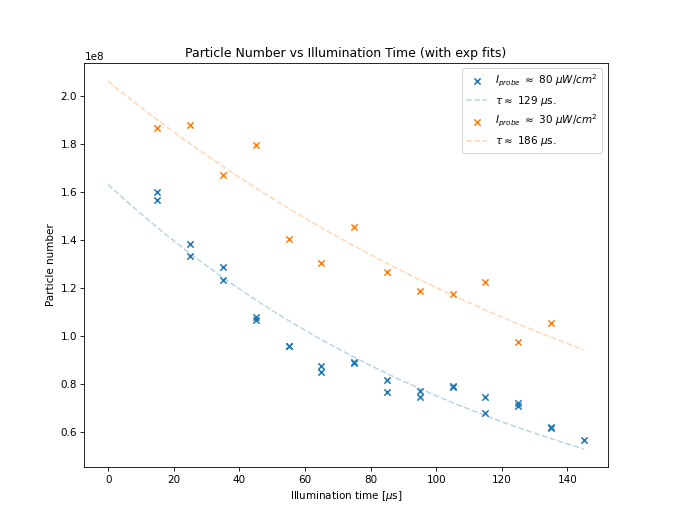

In [24]:
# Get data
# define range of data (is gathered randomly, so make sure to account for that.)
t_light1 = [get_parameter(20230523, shot, "t_light") for shot in range(86, 113)]
pnums1 = [get_fit_parameter(20230523, shot, "ntherm", "gauss") for shot in range(86, 113)]

t_light2 = [get_parameter(20230523, shot, "t_light") for shot in range(115, 128)]
pnums2 = [get_fit_parameter(20230523, shot, "ntherm", "gauss") for shot in range(115, 128)]


# Fit with an exponential curve
def exp_f(x, a, tau):
    return a*np.exp(-x/tau)

popt, pcov = curve_fit(exp_f, t_light1, pnums1, p0=[5e7, 140])
popt2, pcov2 = curve_fit(exp_f, t_light2, pnums2, p0=[5e7, 140])
xd = np.linspace(0, 145, 10000)

# Plot
plt.figure(figsize=(9, 7))
plt.scatter(t_light1, pnums1, alpha=1, c='C0', marker='x', label=r"$I_{probe}$ $\approx$ 80 $\mu W/cm^2$")
plt.plot(xd, exp_f(xd, popt[0], popt[1]), alpha=0.3, c='C0', ls='--', label=r"$\tau \approx$ {:} $\mu$s.".format(round(popt[1])))
plt.scatter(t_light2, pnums2, alpha=1, c='C1', marker='x', label=r"$I_{probe}$ $\approx$ 30 $\mu W/cm^2$")
plt.plot(xd, exp_f(xd, popt2[0], popt2[1]), c='C1', alpha=0.3, ls='--', label=r"$\tau \approx$ {:} $\mu$s.".format(round(popt2[1])))

plt.legend()
plt.title("Particle Number vs Illumination Time (with exp fits)")
plt.xlabel("Illumination time [$\mu$s]")
plt.ylabel("Particle number")
plt.savefig("/home/bec_lab/Desktop/imgs/MT_lifetime/illuminaton.png")
plt.show()

In [33]:
def get_average_count(date, shot):
        atoms, flat, dark = openFiles(date, shot, 0, multi_loop=0)
        return flat.mean()

    


<IPython.core.display.Javascript object>


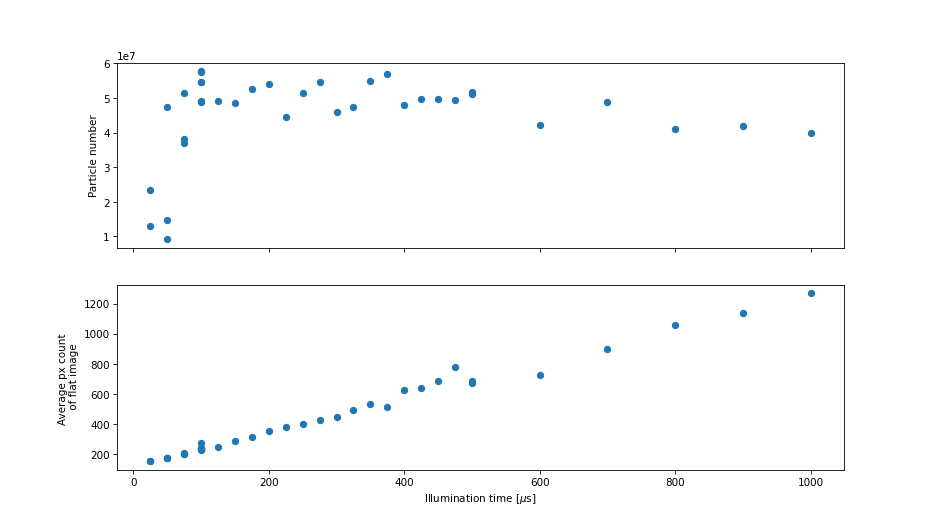

In [42]:
runs = range(167, 203)
pnums_th = [get_fit_parameter(20240927, shot, "ntherm", "gauss") for shot in runs]
pnums_cn = [get_fit_parameter(20240927, shot, "ncount", "gauss") for shot in runs]
tlight = [get_parameter(20240927, shot, "t_light") for shot in runs]
avg_count = [get_average_count(20240927, shot) for shot in runs]


counts_flat = []


fig, ax = plt.subplots(2, 1, sharex=True)

ax[0].scatter(tlight, pnums_th)
ax[1].scatter(tlight, avg_count)

ax[0].set_ylabel("Particle number")
ax[1].set_ylabel("Average px count \n of flat image")
ax[1].set_xlabel("Illumination time [$\mu$s]")

# plt.scatter(tlight, pnums_cn)


plt.show()

## Varying The Zeeman Current 

We suspect problems with the Zeeman slower, so let's investigate the dependence of the particle number at 60s as a function of the zeeman current. Could probably do it at lower cooling times as well. Might try later. 

In [ ]:
ignorenums = [52, 60, 67, 71, 75, 76, 80]
start = 35
stop = 97
### DATA 
pnums = [get_fit_parameter(20230608, shot, "ntherm", "gauss") for shot in range(35, 97) if shot not in ignorenums]
pnums_2 = [get_fit_parameter(20230608, shot, "ntherm", "gauss") for shot in range(117, 147)]

currents = [[9.1]*4, 
            [8]*5,
            [7.5]*3, 
            [7]*3, 
            [6.5]*5, 
            [6]*4,
            [5.5]*4,
            [5]*4,
            [4.5]*4,
            [9.2]*3,
            [9.5]*3,
            [10]*5,
            [9]*5,
            [8.9]*2,
            ]

currents2 = [[4]*2, 
             [4.5]*2,
             [5]*2,
             [5.5]*2,
             [6]*2,
             [6.5]*2,
             [7]*2,
             [7.5]*2,
             [8]*2,
             [8.5]*2,
             [9]*2,
             [9.5]*2,
             [10]*2,
             [10.5]*2,
             [11]*2,
            ]
########


def partition_list(sublists, elements):
    """ To partition the list of pnums in the same way. """
    partitioned_list = []
    start_index = 0
    for sublist in sublists:
        sublist_length = len(sublist)
        partitioned_list.append(elements[start_index:start_index + sublist_length])
        start_index += sublist_length
    return partitioned_list



pnums_part = partition_list(currents, pnums)
pnums2_part = partition_list(currents2, pnums_2)


trendx = []
trendy = []

fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(111)
for cur, pn in zip(currents, pnums_part):
    ax.scatter(cur, pn, color='C0', alpha=0.7)
    ax.scatter(sum(cur)/len(cur), sum(pn)/len(pn), color='C2', alpha=0.7)
    trendx.append(sum(cur)/len(cur)) 
    trendy.append(sum(pn)/len(pn)) 
# Sort trends
# trendysorted = [x for _, x in sorted(zip(trendx, trendy))]
# trendxsorted = sorted(trendx)
# ax.plot(trendxsorted, trendysorted, c='C0', ls='--', linewidth=1, alpha=0.65)


trendx = []
trendy = []
ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
for cur, pn in zip(currents2, pnums2_part):
    ax2.scatter(cur, pn, color='C2', alpha=0.7)
    ax2.scatter(sum(cur)/len(cur), sum(pn)/len(pn), color='C2', alpha=0.7)
    trendx.append(sum(cur)/len(cur)) 
    trendy.append(sum(pn)/len(pn)) 
# Sort trends
# trendysorted = [x for _, x in sorted(zip(trendx, trendy))]
# trendxsorted = sorted(trendx)
# ax2.plot(trendxsorted, trendysorted, c='C2', ls='--', linewidth=1, alpha=0.65)


ax.axvspan(8.9, 9.1, alpha=0.3, color='C1')
ax.invert_xaxis()
ax.set_title("Varying the current through the Zeeman coils", fontweight='bold')
ax.set_xlabel("Current [A]", fontweight='bold')
ax.set_ylabel("Particle at 60s", color='C0', fontweight='bold')
ax2.set_ylabel("Particle at 1s", color='C2', fontweight='bold')
ax.tick_params(axis='y', labelcolor='C0')
ax2.tick_params(axis='y', labelcolor='C2')
plt.show()

## Varying polarization angle of Zeeman 

In [ ]:
# parse ignore numbers from ignore file
file1 = open('/storage/BECViewer/ignore/20230608', 'r')
Lines = file1.readlines()

def getComment(shot):
    file1 = open('/storage/BECViewer/comments/20230608_{:}.txt'.format(str(shot).zfill(4)), 'r')
    return float(file1.read())

ignorenums = [int(el) for el in Lines]
runs = range(204, 300)
pnums = [get_fit_parameter(20230608, shot, "ntherm", "gauss") for shot in runs if shot not in ignorenums]
angle = [getComment(shot)-50 for shot in runs if shot not in ignorenums]
# parse from comments

fig, ax = plt.subplots(1, 1, figsize=(9, 6))
ax.axvline(0, ls='--', alpha=0.3, color='C0')
ax.scatter(angle, pnums, color='C1', alpha=0.7)
ax.tick_params(axis='y', labelcolor='C1')
ax.set_title("Dependence on polarization angle of the Zeeman slwoer", fontweight='bold')
ax.set_xlabel("Angle detuning from set (deg)", fontweight='bold')
ax.set_ylabel("Particle Number (at 10 s RF time)", color='C1', fontweight='bold')
plt.show()

########

## Varying Zeeman Repump Power

In [ ]:
# parse ignore numbers from ignore file
file1 = open('/storage/BECViewer/ignore/20230608', 'r')
Lines = file1.readlines()
ignorenums = [int(el) for el in Lines]

def getComment(shot):
    file1 = open('/storage/BECViewer/comments/20230608_{:}.txt'.format(str(shot).zfill(4)), 'r')
    return float(file1.read())

runs = range(303, 349)
pnums = [get_fit_parameter(20230608, shot, "ntherm", "gauss") for shot in runs if shot not in ignorenums]
angle = [getComment(shot) for shot in runs if shot not in ignorenums]
# parse from comments

fig, ax = plt.subplots(1, 1, figsize=(9, 6))
ax.scatter(angle, pnums, color='C1', alpha=0.7)
ax.tick_params(axis='y', labelcolor='C1')
ax.set_ylim(0, 1.1e9)
ax.set_title("Dependence on the Zeeman repump power", fontweight='bold')
ax.set_xlabel("Repump power (main Zeeman at ~135 mW))", fontweight='bold')
ax.set_ylabel("Particle Number (at 10 s RF time)", color='C1', fontweight='bold')
plt.show()

########

In [ ]:
# parse ignore numbers from ignore file
file1 = open('/storage/BECViewer/ignore/20230608', 'r')
Lines = file1.readlines()
ignorenums = [int(el) for el in Lines]


runs_p1 = range(69, 77)
pnums_p1 = [get_fit_parameter(20230627, shot, "ntherm", "gauss") for shot in runs_p1 if shot not in ignorenums]
runs_p2 = range(77, 86)
pnums_p2 = [get_fit_parameter(20230627, shot, "ntherm", "gauss") for shot in runs_p2 if shot not in ignorenums]
runs_p3 = range(86, 97)
pnums_p3 = [get_fit_parameter(20230627, shot, "ntherm", "gauss") for shot in runs_p3 if shot not in ignorenums]
runs_p4 = range(97, 107)
pnums_p4 = [get_fit_parameter(20230627, shot, "ntherm", "gauss") for shot in runs_p4 if shot not in ignorenums]


fig, ax = plt.subplots(1, 1, figsize=(9, 6))

ax.scatter(runs_p1, pnums_p1, color='C0', alpha=0.7, label="135 mW + 4.5 mW")
ax.scatter(runs_p2, pnums_p2, color='C1', alpha=0.7, label="65 mW + 2.5 mW")
ax.scatter(runs_p3, pnums_p3, color='C2', alpha=0.7, label="35 mW + 1.7 mW")
ax.scatter(runs_p4, pnums_p4, color='C3', alpha=0.7, label="15 mW + 1 mW")

ax.set_ylim(0, 1.3e8)
ax.set_title("Dependence on the Zeeman power - 2023-06-27", fontweight='bold')
ax.set_xlabel("RUN")
ax.set_ylabel("Particle Number (at 60 s RF time)")
plt.legend()
plt.show()

########

## Varying the current through the MOT coils

### 2023-06-20

In [ ]:
# parse ignore numbers from ignore file
runs = range(13, 26)
pnums = [get_fit_parameter(20230620, shot, "ntherm", "gauss") for shot in runs]
current = [11.7, 13.3, 14.9, 16.5, 18.1, 19.7, 21.3, 22.9, 24.5, 26.1, 27.7, 29.3, 30.9]
# parse from comments

fig, ax = plt.subplots(1, 1, figsize=(9, 6))
ax.axvline(x=15.5, c='C1', alpha=0.4, ls='--')
ax.text(15, 5e8, "Old Value", ha='left', c='C1', alpha=0.7, rotation=90)
ax.scatter(current, pnums, color='C0', alpha=0.7)
ax.tick_params(axis='y', labelcolor='C0')
ax.set_title("Varying MOT current - 2023-06-20", fontweight='bold')
ax.set_xlabel("Current (A)", fontweight='bold')
ax.set_ylabel("Particle Number (at 1 s RF time)", color='C0', fontweight='bold')
plt.show()

########

### 2023-06-21

<IPython.core.display.Javascript object>


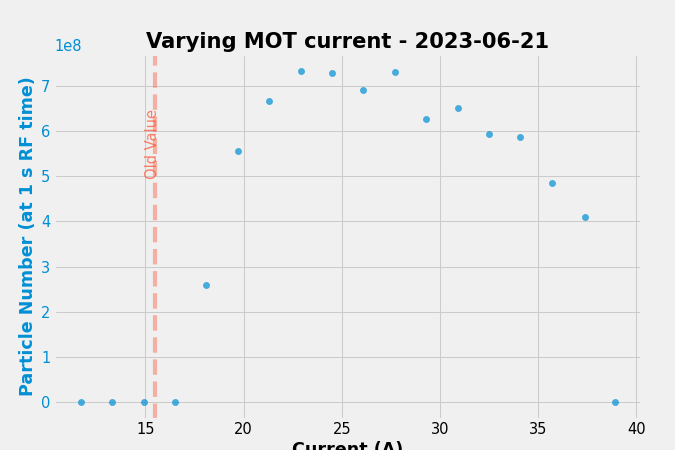

In [11]:
# parse ignore numbers from ignore file
runs = range(111, 129)
pnums = [get_fit_parameter(20230621, shot, "ntherm", "gauss") for shot in runs]
current = [11.7, 13.3, 14.9, 16.5, 18.1, 19.7, 21.3, 22.9, 24.5, 26.1, 27.7, 29.3, 30.9, 32.5, 34.1, 35.7, 37.4, 38.9]
# parse from comments

fig, ax = plt.subplots(1, 1, figsize=(9, 6))
ax.axvline(x=15.5, c='C1', alpha=0.4, ls='--')
ax.text(15, 5e8, "Old Value", ha='left', c='C1', alpha=0.7, rotation=90)
ax.scatter(current, pnums, color='C0', alpha=0.7)
ax.tick_params(axis='y', labelcolor='C0')
ax.set_title("Varying MOT current - 2023-06-21", fontweight='bold')
ax.set_xlabel("Current (A)", fontweight='bold')
ax.set_ylabel("Particle Number (at 1 s RF time)", color='C0', fontweight='bold')
plt.show()

########

In [ ]:
pnums_old = pnums

### 2026-03-27

In [ ]:
runs = range(22, 40)
pnums = [get_fit_parameter(20230627, shot, "ntherm", "gauss") for shot in runs]
current = [11.7, 13.3, 14.9, 16.5, 18.1, 19.7, 21.3, 22.9, 24.5, 26.1, 27.7, 29.3, 30.9, 32.5, 34.1, 35.7, 37.4, 38.9]
# parse from comments

fig, ax = plt.subplots(1, 1, figsize=(9, 6))
ax.axvline(x=15.5, c='C1', alpha=0.4, ls='--')
ax.text(15, 1e8, "Old Value", ha='left', c='C1', alpha=0.7, rotation=90)
ax.scatter(current, pnums, color='C0', alpha=0.7, label='2023-06-27')
ax2 = ax.twinx()
ax2.scatter(current, pnums_old, color='C2', alpha=0.7, label='2023-06-21')
ax.tick_params(axis='y', labelcolor='C0')
ax2.tick_params(axis='y', labelcolor='C2')
ax.set_title("Particle Number vs MOT Current", fontweight='bold')
ax.set_xlabel("Current (A)", fontweight='bold')
ax.set_ylabel("2023-06-27 (at 60 s RF time)", color='C0', fontweight='bold')
ax2.set_ylabel("2023-06-21 (at 1 s RF time)", color='C2', fontweight='bold')
plt.show()


########

### 2023-07-04

In [ ]:
runs = range(12, 30) # Should be 18 shots
pnums = [get_fit_parameter(20230704, shot, "ntherm", "gauss") for shot in runs]
current = [11.7, 13.3, 14.9, 16.5, 18.1, 19.7, 21.3, 22.9, 24.5, 26.1, 27.7, 29.3, 30.9, 32.5, 34.1, 35.7, 37.4, 38.9]
setpointsvs = np.linspace(1.5, 4.9, 18)


fig, ax = plt.subplots(1, 1, figsize=(9, 6))
ax.axvline(x=15.5, c='C1', alpha=0.4, ls='--')
ax.text(15, 1.3e8, "Old Value", ha='left', c='C1', alpha=0.7, rotation=90)
ax.scatter(current, pnums, color='C0', alpha=0.7)
ax.tick_params(axis='y', labelcolor='C0')

ax2 = ax.twiny()
ax2.plot(setpointsvs, pnums, alpha=0.2, c='C2')
ax2.set_xlabel('Setpoint (V)', fontweight='bold')
ax2.tick_params(direction='in')

fig.suptitle("Varying MOT current - 2023-07-04", fontweight='bold', y=0.99)
ax.set_xlabel("Coil Current (A)", fontweight='bold')
ax.set_ylabel("Particle Number (at 60 s RF time)", color='C0', fontweight='bold')
plt.show()

########

### 2023-07-06

In [ ]:
plt.style.use('default')

In [ ]:
runs = range(199, 217) # Should be 18 shots
pnums = [get_fit_parameter(20230706, shot, "ntherm", "gauss") for shot in runs]
current = [11.7, 13.3, 14.9, 16.5, 18.1, 19.7, 21.3, 22.9, 24.5, 26.1, 27.7, 29.3, 30.9, 32.5, 34.1, 35.7, 37.4, 38.9]
# setpointsvs = np.linspace(1.5, 4.9, 18)
setpointsvs = [get_parameter(20230706, shot, "MOTcurr") for shot in runs]



fig, ax = plt.subplots(1, 1, figsize=(9, 6))
ax.axvline(x=15.5, c='C1', alpha=0.4, ls='--')
ax.text(15, 1.3e8, "Old Value", ha='left', c='C1', alpha=0.7, rotation=90)
ax.scatter(current, pnums, color='C0', alpha=0.7)
ax.tick_params(axis='y', labelcolor='C0')

ax2 = ax.twiny()
ax2.plot(setpointsvs, pnums, alpha=0.2, c='C2')
ax2.set_xlabel('Setpoint (V)', fontweight='bold')
ax2.tick_params(direction='in')

fig.suptitle("Varying MOT current - 2023-07-06", fontweight='bold', y=0.99)
ax.set_xlabel("Coil Current (A)", fontweight='bold')
ax.set_ylabel("Particle Number (at 60 s RF time)", color='C0', fontweight='bold')
plt.show()

########

In [ ]:
runs = range(199, 247)
pnums = [get_fit_parameter(20230706, shot, "ntherm", "gauss") for shot in runs]
setpointsvs = [get_parameter(20230706, shot, "MOTcurr") for shot in runs]

fig, ax = plt.subplots(1, 1, figsize=(9, 6))
fig.suptitle("Varying MOT current - 2023-07-06", fontweight='bold', y=0.99)

ax.scatter(setpointsvs[:18], pnums[:18], alpha=0.7, c='C0', label="Run 1")
ax.plot(setpointsvs[:18], pnums[:18], alpha=0.2, c='C0')
ax.scatter(setpointsvs[18:37], pnums[18:37], alpha=0.7, c='C1', label="Run 2")
ax.plot(setpointsvs[18:37], pnums[18:37], alpha=0.2, c='C1')
ax.scatter(setpointsvs[37:], pnums[37:], alpha=0.7, c='C2', label="Run 3")
ax.plot(setpointsvs[37:], pnums[37:], alpha=0.2, c='C2')

ax.tick_params(axis='y', labelcolor='C0')
ax.set_xlabel('Setpoint (V)', fontweight='bold')
ax.set_xlabel("Coil Current (A)", fontweight='bold')
ax.set_ylabel("Particle Number (at 60 s RF time)", color='C0', fontweight='bold')
plt.legend()
plt.show()

########

### 2023-07-07

In [ ]:
runs = range(12, 42)
pnums = [get_fit_parameter(20230707, shot, "ntherm", "gauss") for shot in runs]
setpointsvs = [get_parameter(20230707, shot, "MOTcurr") for shot in runs]

fig, ax = plt.subplots(1, 1, figsize=(9, 6))
fig.suptitle("Varying MOT current - 2023-07-07", fontweight='bold')

ax.scatter(setpointsvs[:18], pnums[:18], alpha=0.7, c='C0', label="Run 1")
# ax.plot(setpointsvs[:18], pnums[:18], alpha=0.2, c='C0')
ax.scatter(setpointsvs[18:37], pnums[18:37], alpha=0.7, c='C1', label="Run 2")
# ax.plot(setpointsvs[18:37], pnums[18:37], alpha=0.2, c='C1')
# ax.scatter(setpointsvs[37:], pnums[37:], alpha=0.7, c='C2', label="Run 3")
# ax.plot(setpointsvs[37:], pnums[37:], alpha=0.2, c='C2')

ax.tick_params(axis='y', labelcolor='C0')
ax.set_xlabel('Setpoint (V)', fontweight='bold')
ax.set_xlabel("Coil Current (A)", fontweight='bold')
ax.set_ylabel("Particle Number (at 60 s RF time)", color='C0', fontweight='bold')
plt.legend()
plt.show()

########

### 2023-07-14

In [ ]:
runs = range(9, 27) # Should be 18 shots
pnums = [get_fit_parameter(20230714, shot, "ntherm", "gauss") for shot in runs]
current = [11.7, 13.3, 14.9, 16.5, 18.1, 19.7, 21.3, 22.9, 24.5, 26.1, 27.7, 29.3, 30.9, 32.5, 34.1, 35.7, 37.4, 38.9]
# setpointsvs = np.linspace(1.5, 4.9, 18)
setpointsvs = [get_parameter(20230714, shot, "MOTcurr") for shot in runs]



fig, ax = plt.subplots(1, 1, figsize=(9, 6))
ax.axvline(x=1.975, c='C1', alpha=0.4, ls='--')
ax.text(15, 1.3e8, "Old Value", ha='left', c='C1', alpha=0.7, rotation=90)
ax.scatter(setpointsvs, pnums, color='C0', alpha=0.7)
ax.plot(setpointsvs, pnums, color='C0', alpha=0.1)
ax.tick_params(axis='y', labelcolor='C0')

fig.suptitle("Varying MOT current - 2023-07-14", fontweight='bold', y=0.99)
ax.set_xlabel("Setpoint (V)", fontweight='bold')
ax.set_ylabel("Particle Number (at 60 s RF time)", color='C0', fontweight='bold')
plt.show()

########

### 2023-07-18 

In [ ]:
date = 20230718
runs = range(54, 67) # Should be 18 shots


pnums = [get_fit_parameter(date, shot, "ntherm", "gauss") for shot in runs]
setpointsvs = [get_parameter(date, shot, "MOTcurr") for shot in runs]

fig, ax = plt.subplots(1, 1, figsize=(9, 6))
ax.axvline(x=1.975, c='C1', alpha=0.4, ls='--')
ax.text(15, 1.3e8, "Old Value", ha='left', c='C1', alpha=0.7, rotation=90)
ax.scatter(setpointsvs, pnums, color='C0', alpha=0.7)
ax.plot(setpointsvs, pnums, color='C0', alpha=0.1)
ax.tick_params(axis='y', labelcolor='C0')

fig.suptitle("Varying MOT current - {:}-{:}-{:}".format(str(date)[:4], str(date)[4:6], str(date)[6:8]), fontweight='bold', y=0.99)
ax.set_xlabel("Setpoint (V)", fontweight='bold')
ax.set_ylabel("Particle Number (at 60 s RF time)", color='C0', fontweight='bold')
plt.show()

########

## Comparing different locks of the F=2 laser - 2023-07-07

In [ ]:
file1 = open('/storage/BECViewer/ignore/20230707', 'r')
Lines = file1.readlines()
ignorenums = [int(el) for el in Lines]

last_run = int(sorted(next(os.walk('/storage/data/20230707'))[1])[-1])
runs = list(range(42, last_run + 1))

for el in ignorenums:
    runs.remove(el)
    
pnums = [get_fit_parameter(20230707, shot, "ntherm", "gauss") for shot in runs]


fig, ax = plt.subplots(1, 1, figsize=(9, 6))
fig.suptitle("Detuning the F=2 laser", fontweight='bold', y=0.99)

ax.scatter(runs[:9], pnums[:9], alpha=0.7, c='C0', label="$\delta$ = 0")
ax.scatter(runs[9:16], pnums[9:16], alpha=0.7, c='C1', label="$\delta$ = +1 au")
ax.scatter(runs[16:19], pnums[16:19], alpha=0.7, c='C2', label="$\delta$ = +2 au")
ax.scatter(runs[19:], pnums[19:], alpha=0.7, c='C3', label="$\delta$ = -1 au")

ax.plot(runs, pnums, c='k', alpha=0.1, ls='--')
ax.tick_params(axis='y', labelcolor='C0')
ax.set_xlabel('Setpoint (V)', fontweight='bold')
ax.set_xlabel("Run")
ax.set_ylabel("Particle Number (at 60 s RF time)", color='C0', fontweight='bold')
plt.legend()
plt.show()

########

## POSTER FIGURES

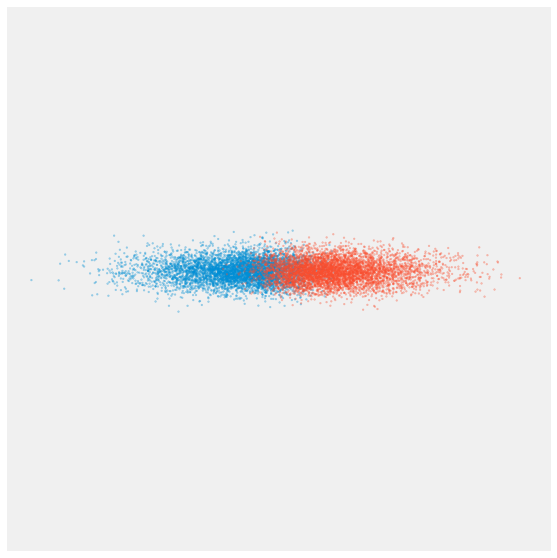

In [433]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import skewnorm

# Generate 3D data for the elongated ellipsoid-shaped cloud of atoms
n_points = 5000

for i in [50]: # range(100):
    a = i * 0.06
#     a = 0.2

    x1 = skewnorm.rvs(a=a, size=n_points) * 2  # 'a' parameter controls the skewness
    y1 = np.random.normal(0, 0.4, n_points)
    z1 = np.random.normal(0, 0.4, n_points)  # Elongated along the Z-axis


    x2 = skewnorm.rvs(a=-a, size=n_points) * 2  # 'a' parameter controls the skewness
    y2 = np.random.normal(0, 0.4, n_points)
    z2 = np.random.normal(0, 0.4, n_points)  # Elongated along the Z-axis

    # Generate density components (ellipsoid along Z-axis, and two distinct components)
    density_component_1 = np.zeros(n_points) # np.exp(-(x**2 + y**2 + (z / 3)**2) / 20)
    density_component_2 = np.ones(n_points) # np.exp(-(x**2 + y**2 + (z - 3)**2) / 20)

    # Plot the 3D ellipsoid-shaped cloud of atoms
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x1, y1, z1, c='C0', s=3, alpha=0.32, label='Density Component 1')
    ax.scatter(x2, y1, z2, c='C1', s=3, alpha=0.32, label='Density Component 2')
    # ax.scatter(x1[::2], y1[::2], z1[::2], c='C0', s=30, alpha=0.32, label='Density Component 1')
    # ax.scatter(x1[1:2], y1[1:2], z1[1:2], c='C0', s=30, alpha=0.32, label='Density Component 1')

    ax.set_axis_off() 
    ax.set_xlim([-5, 5])
    ax.set_ylim([-5, 5])
    ax.set_zlim([-5, 5])

    ax.view_init(elev=30, azim=90)

#     plt.savefig(f"/home/bec_lab/Desktop/spinDomainFake/atoms_{str(i).zfill(4)}.png", transparent = True)
    plt.show()



In [69]:
save_folder = "/home/bec_lab/python/Publication_Figures/SpinDependentOAH/figures/contrast_build/"
images = []
for filename in sorted(os.listdir(save_folder)):
    print("Moviefying ", filename)
    images.append(imageio.imread(save_folder + filename))
    clear_output(wait=True)
imageio.mimsave(save_folder+'allfigs.mov', images, fps=7)
imageio.mimsave(save_folder+'allfigs.gif', images, fps=7)
print("Moviefying completed!")

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (700, 700) to (704, 704) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Moviefying completed!


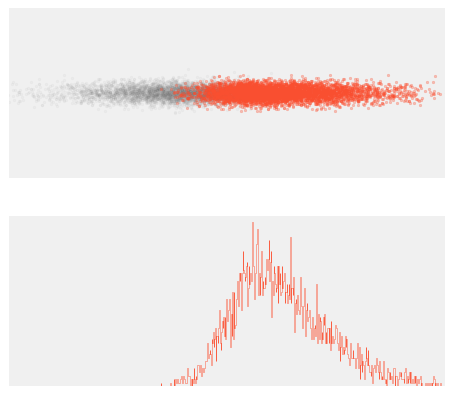

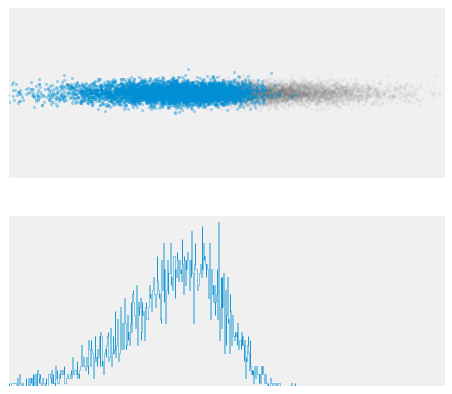

In [434]:
# Plot projections of only first component
# fs = 40
# ss = 30

fs = 7
ss = 7

fig, (ax, ax1) = plt.subplots(2, 1, figsize=(fs,fs))
ax.scatter(x2, y2, s=ss, c='gray', alpha=0.05)
ax.scatter(x1, y1, s=ss, c='C1', alpha=0.32)

ax1.hist(x1, 500, density=True, histtype='step', color='C1', alpha=0.9)
ax.set_ylim([-6, 6])

for ax in [ax, ax1]:
    ax.set_xlim([-6, 6])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines[['right', 'left', 'top', 'bottom']].set_color('white')
# plt.savefig("/home/bec_lab/Desktop/UUOneDrive/atomsS1.png", transparent = True)
plt.show()

# Plot projections of only second component
fig, (ax, ax1) = plt.subplots(2, 1, figsize=(fs,fs))
ax.scatter(x1, y1, s=ss, c='gray', alpha=0.05)
ax.scatter(x2, y2, s=ss, c='C0', alpha=0.32)
ax1.hist(x2, 500, density=True, histtype='step', color='C0', alpha=0.9)
ax.set_ylim([-6, 6])

for ax in [ax, ax1]:
    ax.set_xlim([-6, 6])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines[['right', 'left', 'top', 'bottom']].set_color('white')
# plt.savefig("/home/bec_lab/Desktop/UUOneDrive/atomsS2.png", transparent = True)
plt.show()



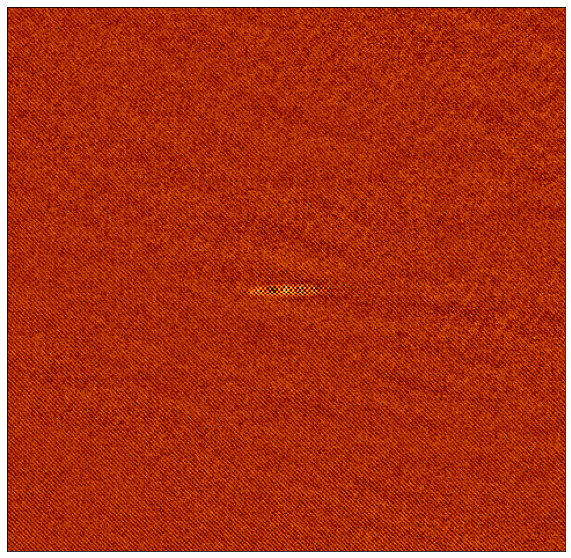

In [473]:
plt.style.use('default')  # pretty cool looking 
%matplotlib inline


pic = makeAPic(20230425, 137, num=0, multi_loop=0)
fig, ax = plt.subplots(1,1, figsize=(10, 10))
ax.imshow(pic[900:1370, 920:1402], vmin=0, vmax=1.6, cmap='afmhot_r', interpolation=None, origin="lower")
ax.set_xticks([])
ax.set_yticks([])
# plt.savefig("/home/bec_lab/Desktop/UUOneDrive/double_interference.png", transparent = True)
plt.show()

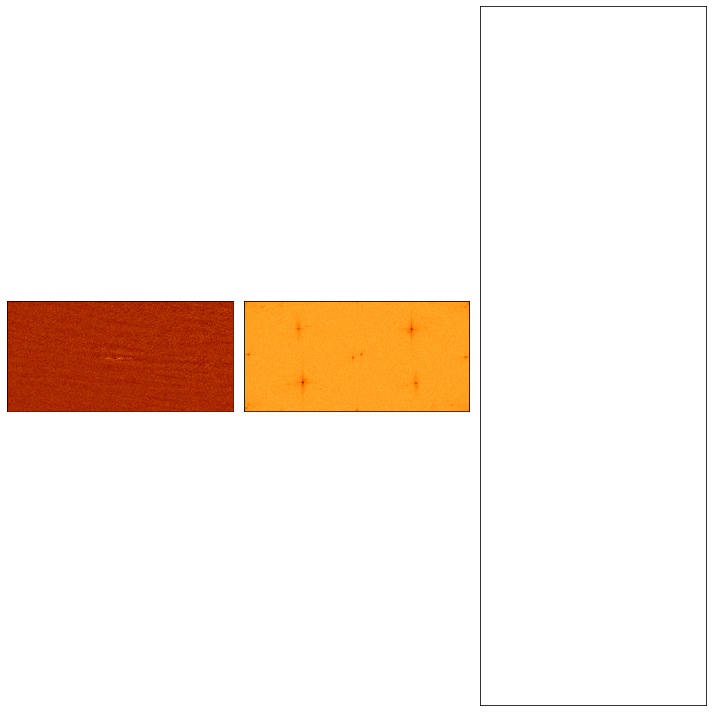

In [520]:
pic = makeAPic(20230425, 137, num=0, multi_loop=0)
fig, ax = plt.subplots(1, 3, figsize=(10, 10))
ax[0].imshow(pic[900:1370, 920:1402], vmin=0, vmax=1.6, cmap='afmhot_r', interpolation=None, origin="lower", aspect=0.5)
ax[1].imshow(abs(fft.fft2(makeAPic(20230425, 137, num=0, multi_loop=0)[900:1370, 920:1402])), cmap='afmhot_r', norm=LogNorm(), interpolation=None, origin="lower", aspect=0.5)

for a in ax:
    a.set_xticks([])
    a.set_yticks([])
# plt.savefig("/home/bec_lab/Desktop/UUOneDrive/double_interference.png", transparent = True)
plt.tight_layout()
plt.show()

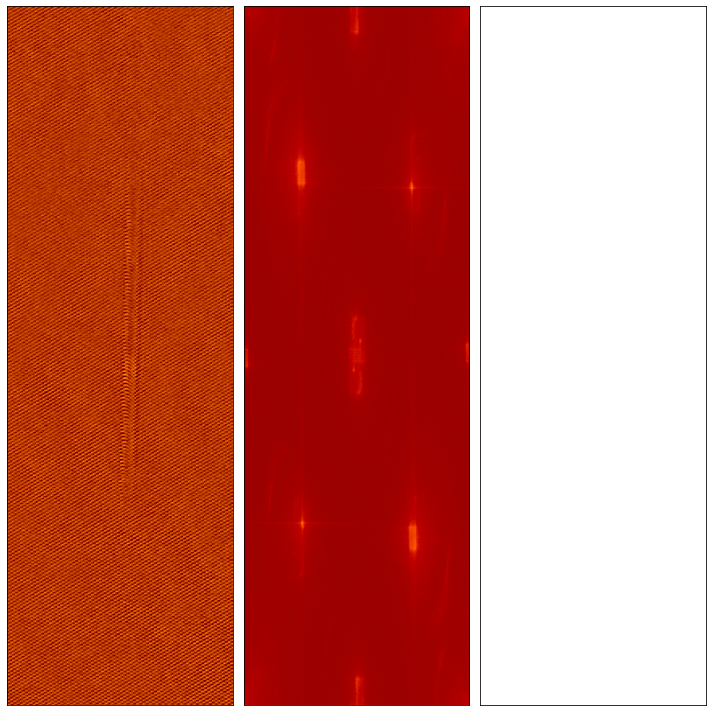

In [562]:
pic = makeAPic(20231024, 350, num=0, multi_loop=0)

fig, ax = plt.subplots(1, 3, figsize=(10, 10))
ax[0].imshow(pic[1001:1141, 677:1476].T, vmin=0, vmax=1.6, cmap='afmhot_r', interpolation=None, origin="lower", aspect="auto")
ax[1].imshow(abs(fft.fft2(pic)).T, cmap=plt.get_cmap('gist_heat'), norm=colors.LogNorm(), interpolation=None, origin="lower", aspect='auto')

for a in ax:
    a.set_xticks([])
    a.set_yticks([])
# plt.savefig("/home/bec_lab/Desktop/UUOneDrive/double_interference.png", transparent = True)

plt.tight_layout()
plt.show()

## SDOAH Presentation 2023-07-25

### Cooling In the MT 

In [ ]:
date = 20230420
runs = range(19, 108)

pnums = [get_fit_parameter(date, shot, "ntherm", "gauss") for shot in runs if shot not in [86]]
tx = [get_fit_parameter(date, shot, "tx", "gauss") for shot in runs if shot not in [86]]
tz = [get_fit_parameter(date, shot, "tz", "gauss") for shot in runs if shot not in [86]]
temp = np.add(tx, tz)
rf = [get_parameter(date, shot, "rftime") for shot in runs if shot not in [86]]


fig, ax = plt.subplots(1,1)
ax.scatter(rf, np.array(pnums)/1e6, c='C0', marker='x', alpha=0.4)

ax2 = ax.twinx()
ax2.scatter(rf, temp/1e-6, c='C1', marker='o', alpha=0.4)


ax.tick_params(axis='y', labelcolor='C0')
ax2.tick_params(axis='y', labelcolor='C1')
ax.set_xlabel("RF Cooling Time [s]")
ax.set_ylabel("Particle Number [M]", color='C0')
ax2.set_ylabel("Temperature [$\mu$K]", color='C1')


### Cooling video in MT

In [ ]:
# make a video of cooling 
xbin = 4
zbin = 4
for shot in range(19, 108):
    pic = makeAPic(20230420, shot, num=0, multi_loop=0)
    # Normalize the background for a pretty video: 
    pic -= (pic[34:40].mean()-1)
    # Maybe bin
    if pic.shape[0] % xbin != 0:
        pic = pic[:-(pic.shape[0] % xbin), :]
    if pic.shape[1] % zbin != 0:
        pic = pic[:, :-(pic.shape[1] % zbin)]
    pic = pic.reshape(pic.shape[0] // xbin, xbin, pic.shape[1] // zbin, zbin).mean(axis=3).mean(axis=1)
    
    fig, ax = plt.subplots(1,1)
    rf = get_parameter(date, shot, "rftime")
    ax.imshow(pic, vmin=0, vmax=1.3, cmap='afmhot_r', interpolation='none', origin="lower")
    ax.set_title("RF Cooling = {:} s".format(rf))
    ax.set_xticks([])
    ax.set_yticks([])
    plt.savefig("/home/bec_lab/Desktop/imgs/absorption_cooling/{:}.png".format(str(shot).zfill(4)))
    plt.close()

In [ ]:
images = []
for filename in sorted(os.listdir("/home/bec_lab/Desktop/imgs/absorption_cooling/")):
    print("Moviefying ", filename)
    images.append(imageio.imread("/home/bec_lab/Desktop/imgs/absorption_cooling/" + filename))
    clear_output(wait=True)
imageio.mimsave('/home/bec_lab/Desktop/UUOneDrive/Desktop/cooling.gif', images)
print("Moviefying completed!")
# for filename in os.listdir("/home/bec_lab/Desktop/imgs/"):
#     if filename.endswith(".png"):
#         os.remove(os.path.join("/home/bec_lab/Desktop/imgs/", filename))     
# print("All temp files deleted.")

In [ ]:
# make a video of cooling 
xbin = 4
zbin = 4
for num in range(100):
    atoms, flat, dark, fft_atoms, fft_flat, ang1, amp = fft_analysis(20210412, 99, num, 0.0000, quad_cut="quad1", multi_loop=0, el_x=10, el_z=100, edge_x=10, edge_z=80, e_w=0.1)
    pic = ang1[:, 500:1300]
#     # Normalize the background for a pretty video: 
#     pic -= (pic[34:40].mean()-1)
#     # Maybe bin
#     if pic.shape[0] % xbin != 0:
#         pic = pic[:-(pic.shape[0] % xbin), :]
#     if pic.shape[1] % zbin != 0:
#         pic = pic[:, :-(pic.shape[1] % zbin)]
#     pic = pic.reshape(pic.shape[0] // xbin, xbin, pic.shape[1] // zbin, zbin).mean(axis=3).mean(axis=1)
    cooltime = 77
    fig, ax = plt.subplots(1,1)
    ax.imshow(pic, vmin=-4., vmax=0.5, cmap='afmhot_r', interpolation='none', origin="lower")
    ax.set_title("RF Cooling = {:} s".format(cooltime))
    ax.set_xticks([])
    ax.set_yticks([])
    plt.savefig("/home/bec_lab/Desktop/imgs/OAH_cooling/{:}.png".format(str(num).zfill(4)))
    plt.close()
    cooltime =+ 0.066

### Overlap ODT

In [ ]:
pic = makeAPic(20230228, 153, num=0, multi_loop=0)
fig, ax = plt.subplots(1,1)
ax.imshow(pic, vmin=0, vmax=1.3, cmap='afmhot_r', interpolation='none', origin="lower")
ax.set_xticks([])
ax.set_yticks([])
plt.show()

###  Condensate in ODT 

In [ ]:
pic = makeAPic(20230711, 35, num=0, multi_loop=0)
fig, ax = plt.subplots(1,1)
ax.imshow(pic, vmin=0, vmax=1.3, cmap='afmhot_r', interpolation='none', origin="lower")
ax.set_xticks([])
ax.set_yticks([])
plt.show()

### Stern Gerlach Or Whatever it is

In [19]:
pic = makeAPic(20230724, 20, num=0, multi_loop=0)
fig, ax = plt.subplots(1,1)
ax.imshow(pic, vmin=0, vmax=1.3, cmap='afmhot_r', interpolation='none', origin="lower")
ax.set_xticks([])
ax.set_yticks([])
plt.show()

/home/bec_lab/python/BECViewer/pckg/fit/OAHDEV_functions.py:95: RuntimeWarning: divide by zero encountered in divide
  pic = (atom - dark) / (flat - dark)
/home/bec_lab/python/BECViewer/pckg/fit/OAHDEV_functions.py:95: RuntimeWarning: invalid value encountered in divide
  pic = (atom - dark) / (flat - dark)


<IPython.core.display.Javascript object>

In [633]:
file_content_binary

b'H\xd6>\x00Mv\xc5\xccKx{@.a2\x13\xb0ZQ@\x8ft"7\x92j_@\xaar^\xb1\x16\x9b~@\xa1\x02m\xa12\xa2x@\xfekv\x8d\xb96D@\x1a\x0b\x0c\x91\xa6\xc5e@\xc3\xc2C\xdc\x8d\x0b\x80@\xe8|\xe0\x1f\xfbpu@\xb5uB1\x0416@\x1a[\\\x9a\x18gl@\x9d\xda\xf0\xd2\x9eo\x80@\x9c\'\x1b\xe6\xa5\nr@\xbaF\xbb\x87\x16\x1d/@\x00\xe6K\xedW\xa5q@+\xa4\xb4\xfd\x16u\x80@\xea\xa0F\xcaW/m@\x90\xaeC\xe9\x03\xd54@\xd6D\x12\xc34\x0fu@K$+@\xb5\x1b\x80@[T\xea$9\x82f@\xd8}n\xac\xd0\xe2B@%\x8be\xd8\x7fHx@\xa8\xa6XOC\xcf~@q\xab*3j]`@\xe7\x98\x8c\x81\xaeeP@\xe4\xc0\xaai\xd8*{@"@l\xe0w\xc2|@\xa7\xb6J#\x1d\x14V@\x07\xd4A\x15J\xbfY@\x8a\x03f\xc5\xe8\x93}@p3]\xa8o)z@\xc2"\xce\xc71\x1eK@\xfa\xd9^\x18v\x87b@a\xc7\xc5\t\xfff\x7f@j\xb8{\x93\x17#w@I\xed\x1c\xe9\xceD>@\xa7\x0c\x9a\xc6\xf6\xe6h@c\xb7\x1c_1G\x80@6\xd4\x05\xdeq\xd3s@4\xa0\x1e\x11\x08\x871@5C\xbc\xbdH\xb2o@\x7f\x96<\xb3+~\x80@\x11\xfd\xffh\xe9ap@\x02\xec\x9b\x16\xbd\x9a0@[\x12W\x10ELs@\x85\xf8c\x04\xe0U\x80@\x00\xcf5\xf5\xf8\xeei@\xa3a\xd6\xf0\xea\x8a;@W\xd1\xa65\xcc\xa3v@\xa2\xce\xbe\x

## Peter's Interference

In [705]:
plt.style.use('default')  # pretty cool looking 
import numpy as np

def read_fortran_unformatted(file_path, dims=(201, 2561), dtype=np.float64):
    with open(file_path, 'rb') as f:
        # Read the file content
        content = f.read()
         
    # FORTRAN unformatted files often have record markers at the beginning and end of each record.
    # These markers typically indicate the number of bytes in the record.
    record_marker_size = 4  # Typically 4 bytes (32-bit integer)
    
    # Compute the size of a single data record
    record_size = np.prod(dims) * np.dtype(dtype).itemsize
    
    # Check that the file size matches the expected size
    expected_file_size = 2 * record_marker_size + record_size
    assert len(content) == expected_file_size, "Unexpected file size"
    
    # Skip the initial record marker
    data_start = record_marker_size
    data_end = data_start + record_size
    
    # Extract the data and convert to numpy array
    data = np.frombuffer(content[data_start:data_end], dtype=dtype).reshape(dims)
    
    return data

# Read the data
atoms = read_fortran_unformatted("/home/bec_lab/Desktop/holog.101")
flat = read_fortran_unformatted("/home/bec_lab/Desktop/holog.201")




In [704]:
# Read the data
atoms = read_fortran_unformatted("/home/bec_lab/Desktop/holog.101")
flat = read_fortran_unformatted("/home/bec_lab/Desktop/holog.201")




<IPython.core.display.Javascript object>


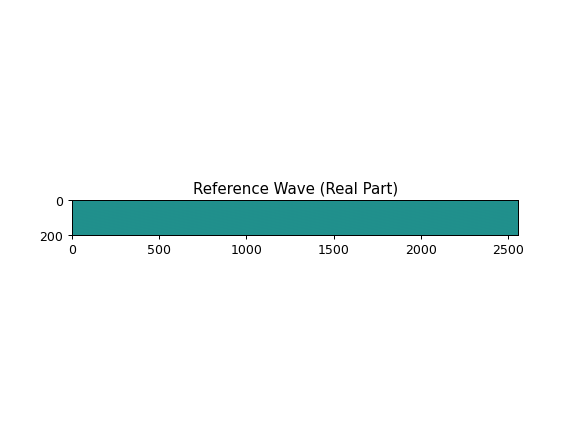

<IPython.core.display.Javascript object>


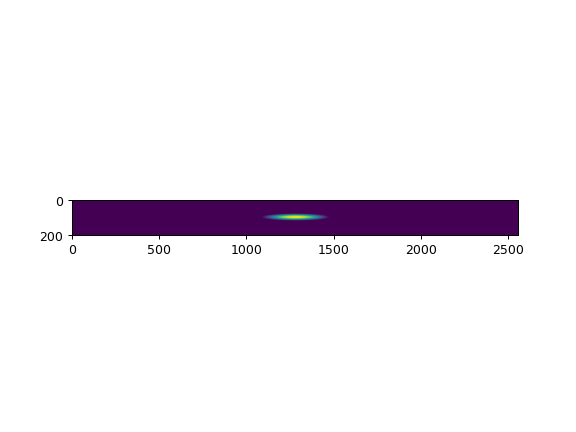

<IPython.core.display.Javascript object>


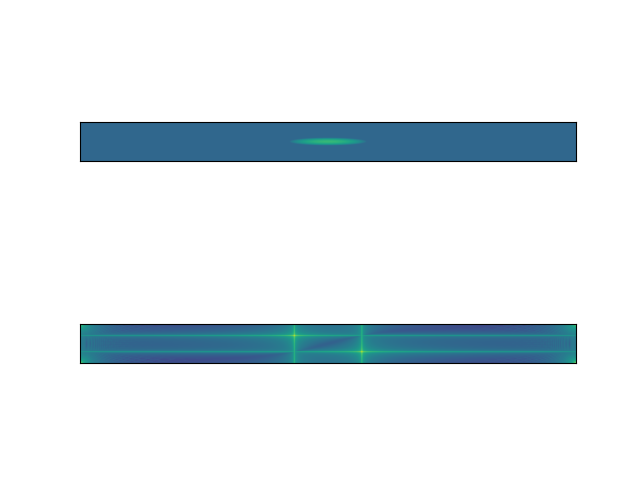

In [749]:
def generate_reference_wave(x, y, wavelength=598e-9, angle=1):
    k = 2 * np.pi / wavelength
    theta = np.radians(angle)
    return np.exp(1j * k * (x * np.cos(theta) + y * np.sin(theta)))

def generate_bec_wave(bec_density):
    return np.sqrt(bec_density) * np.exp(1j * np.angle(bec_density))

x = np.arange(201)
y = np.arange(2561)
xv, yv = np.meshgrid(x, y, indexing='ij')
fitvars = np.array([xv, yv]).reshape(2, -1)


bec_density = tfmod_OAH([0, 1, 0, 200//2, 2560//2, 1, 20, 200], fitvars).reshape(201, 2561)
reference_wave = generate_reference_wave(xv, yv, angle=10)


bec_wave = generate_bec_wave(bec_density)

# Combine the BEC wave with the reference wave
interference_pattern = np.real(bec_wave + reference_wave)

fig, ax = plt.subplots(2, 1)
ax[0].imshow(interference_pattern)
ax[1].imshow(abs(fft.fft2(interference_pattern)), norm=LogNorm())
# plt.title("Interference Pattern (Real Part)")

for a in ax:
    a.set_xticks([])
    a.set_yticks([])
plt.show()

# Calculate the intensity pattern
intensity_pattern = np.abs(interference_pattern)**2



In [ ]:
def intensity_atoms(x, y, I_p=1, I_r1=1, I_r2=1, theta1=1, theta2=1):
    
    k = 2 * np.pi / 589e-9
    PHI_p  = phi_p  + k*(x*np.sin(theta1) + y*np.sin(theta2))
    PHI_r1 = phi_r1 + k*(x*np.sin(theta1) + y*np.sin(theta2)
    PHI_r2 = phi_r2 + k*(x*np.sin(theta1) + y*np.sin(theta2)
    I  = I_p + I_r1 + I_r2 + 2*np.sqrt(I_p*I_r1)*np.cos()    
    return I


plt.figure()
plt.imshow()

## Particle Number Fluctuations 

In [ ]:
## Might want to try this with a data collected in a pure controlled way. 

date = 20230731
runs = range(50, 100)
pnums = [get_fit_parameter(date, shot, "ntherm", "gauss") for shot in runs]
fft_pnum = np.fft.fft(pnums)
fft_freq = np.fft.fftfreq(len(pnums), 90)


fig, ax = plt.subplots(3, 1, figsize=(8, 8))
ax[0].scatter(runs, np.array(pnums)/1e6, c='C0', marker='x', alpha=0.4)
ax[0].plot(runs, np.array(pnums)/1e6, c='C0', alpha=0.4)
ax[1].plot(fft_freq*1000, fft_pnum.imag, c='C1', alpha=0.4)
ax[2].plot(fft_freq*1000, fft_pnum.real, c='C2', alpha=0.4)

# ax[1].set_yscale("log")
# ax[2].set_yscale("log")
ax[2].set_ylim([-3e8, 3e8])           

ax[0].tick_params(axis='y', labelcolor='C0')
ax[-1].set_xlabel("Frequency [mHz]")
plt.show()


## Particle Number Trend

In [76]:
# Go through all the dates, and get all the particle numbers
## Takes about 3 minutes
allpnums = []
alldates = []
path = '/storage/data/'
alldates = next(os.walk(path))[1]
alldates=sorted(alldates)
for date in alldates:
    print(date)
    allruns = next(os.walk(path+date+'/'))[1]
    pnums = []
    for shot in allruns:
        try:
            if get_parameter(date, shot, "rftime1") == 60: 
                pnums.append(get_fit_parameter(date, shot, "ntherm", "gauss"))
        except:
            pass
    allpnums.append(pnums)
    
    

# Then filter them and only take the ones at 60s rf1 (to avoid the lower rfs mostly)


# Filter any missfits (anything above 6e8, we never had more than that at 60s)


# Plot


20200729
20201102
20201103
20201104
20201112
20201120
20201126
20210218
20210219
20210222
20210301
20210311
20210317
20210318
20210319
20210322
20210324
20210325
20210326
20210329
20210401
20210407
20210412
20210415
20210416
20210423
20210428
20210429
20210503
20210506
20210507
20210510
20210517
20210518
20210528
20210602
20210603
20210604
20210607
20210608
20210609
20210610
20210611
20210614
20210615
20210616
20210617
20210618
20210623
20210625
20210628
20210629
20210630
20210820
20210823
20210824
20210825
20210826
20210827
20210830
20210901
20210902
20210903
20210906
20210908
20210909
20210910
20210913
20210914
20210916
20210917
20210921
20210922
20210923
20210924
20210927
20210928
20210930
20211006
20211007
20211008
20211011
20211014
20211015
20211018
20211019
20211020
20211021
20211022
20211026
20211027
20211028
20211101
20211102
20211103
20211108
20211109
20211110
20211115
20211117
20211122
20211124
20211126
20211129
20211130
20211201
20211216
20220106
20220110
20220111
20220112
2

In [81]:
data = [item for sublist in allpnums for item in sublist if (2e7 < item < 6e8)]

<IPython.core.display.Javascript object>


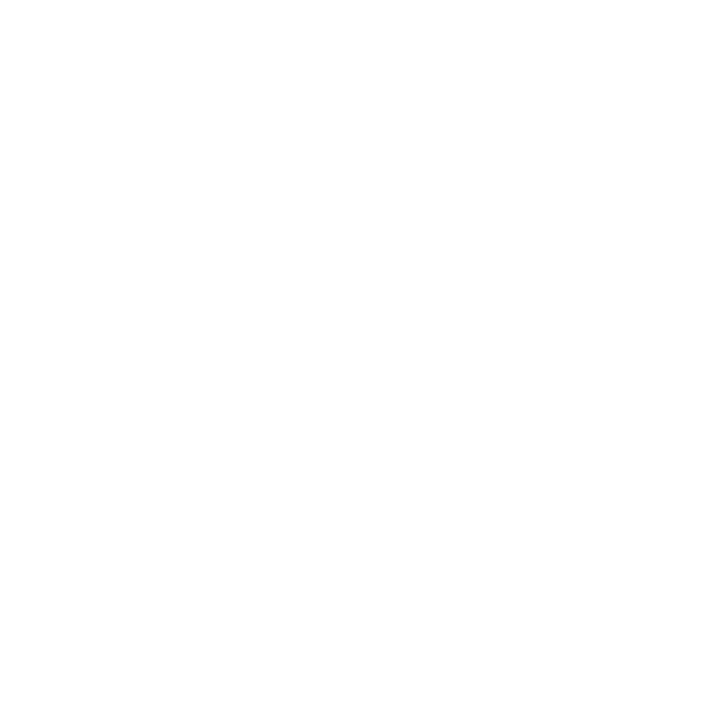

In [92]:
import statistics
from matplotlib.pyplot import cm 
plt.style.use('fivethirtyeight')
fig, ax = plt.subplots(1,1, figsize=(10, 10))
color = cm.copper(np.linspace(0, 1, len(alldates)))
ax.axhline(y=2e8, c='brown', ls='-', alpha=0.4)

for i in range(len(alldates)):
    ax.scatter([alldates[i]]*len(allpnums[i]),allpnums[i], s=15, color=color[i], marker='o', alpha=0.3)

plt.grid(False)
ax.set_yscale('log')
# ax.set_ylim([1e7, 6e8])
ax.set_yticks([])#np.linspace(0, 200, 6))
ax.set_xticks([])#np.linspace(0, 200, 6))
plt.show()

## TOF movement

In [ ]:
from os.path import exists

# date = 20230911
# for shot in range(433, 456):

date = 20230913
for shot in range(251, 305):
    pic = makeAPic(date, shot, num=0, multi_loop=0)
    tof = int(get_parameter(date, shot, "tof"))
    fig, ax = plt.subplots(1,1, figsize=(10, 10))
    ax.imshow(pic[:-400,:], vmin=0, vmax=1.6, cmap='afmhot_r', interpolation='none', origin="lower")
    ax.set_title("TOF = {:} ms".format(tof))
    ax.set_xticks([])
    ax.set_yticks([])
    if exists("/home/bec_lab/Desktop/imgs/ODT/ODT_tof/ODT_tof_MOT_on_after/{:}.png".format(str(tof*10).zfill(4))):
        plt.savefig("/home/bec_lab/Desktop/imgs/ODT/ODT_tof/ODT_tof_MOT_on_after/{:}.png".format(str((tof+0.5)*10).zfill(4)))
    else:
        plt.savefig("/home/bec_lab/Desktop/imgs/ODT/ODT_tof/ODT_tof_MOT_on_after/{:}.png".format(str(tof*10).zfill(4)))
    plt.close()
#     plt.show()

In [ ]:
from os.path import exists

date = 20230914
for shot in range(118, 149):
    pic = makeAPic(date, shot, num=0, multi_loop=0)
    tof = int(get_parameter(date, shot, "tof"))
    fig, ax = plt.subplots(1,1, figsize=(10, 10))
    ax.imshow(pic[:-400,:], vmin=0, vmax=1.6, cmap='afmhot_r', interpolation='none', origin="lower")
    ax.set_title("TOF = {:} ms".format(tof))
    ax.set_xticks([])
    ax.set_yticks([])
    if exists("/home/bec_lab/Desktop/imgs/ODT/ODT_tof/ODT_tof_MOT_on_after_inv/{:}.png".format(str(tof*10).zfill(4))):
        plt.savefig("/home/bec_lab/Desktop/imgs/ODT/ODT_tof/ODT_tof_MOT_on_after_inv/{:}.png".format(str(int((tof+0.5)*10)).zfill(4)))
    else:
        plt.savefig("/home/bec_lab/Desktop/imgs/ODT/ODT_tof/ODT_tof_MOT_on_after_inv/{:}.png".format(str(tof*10).zfill(4)))
    plt.close()
#     plt.show()

In [ ]:
img_dir = "/home/bec_lab/Desktop/imgs/ODT/ODT_tof/ODT_tof_MOT_on_after_inv/"
output_dir = img_dir
images = []
for filename in sorted(os.listdir(img_dir)):
    print("Moviefying ", filename)
    images.append(imageio.imread(img_dir + filename))
#     clear_output(wait=True)
imageio.mimsave(img_dir + 'video_withcomp.mov', images)
print("Moviefying completed!")
# for filename in os.listdir("/home/bec_lab/Desktop/imgs/"):
#     if filename.endswith(".png"):
#         os.remove(os.path.join("/home/bec_lab/Desktop/imgs/", filename))     
# print("All temp files deleted.")

## Particle number fluctuations - 2023-09-19

In [ ]:
date = 20230919
pnum = [get_fit_parameter(date, shot, "ntherm") for shot in range(1, 88) if shot not in [69, 70, 71]]
time = [95*i for i in range(1, 88) if i not in [69, 70, 71]]

plt.figure(figsize=(10,6))
plt.plot(time, pnum, alpha=0.45, c='C1', ls='-')
plt.scatter(time, pnum, marker='o', c='k', alpha=0.4)
plt.axvline(x=2800, c='r', alpha=0.2, ls='--')
plt.axvline(x=3400, c='r', alpha=0.2, ls='--')
plt.text(2810, 1.05e8, "10 min", c='r', alpha=0.4)

plt.xlabel("Time [s]")
plt.ylabel("Particle number")

In [ ]:
for i in range(10):
    print(dts[i+1]-dts[i])

In [ ]:
plt.figure()
plt.plot(fft_num)
plt.show()

## More particle number fluctuations 2023-10-31

In [27]:
from datetime import datetime
import pathlib

date = 20231031
runs = range(1, 400)
ignore = []
if os.path.exists(f"/storage/BECViewer/ignore/{date}"):
    with open(f"/storage/BECViewer/ignore/{date}", "r") as f:
        for line in f:
            ignore.append(int(line.strip()))
    ignore = sorted(list(dict.fromkeys(ignore)))  # eliminate duplicates
print(f"{ignore=}")

ignore=[96, 98, 99, 100, 101, 108, 109, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 213, 214, 215, 216, 217, 218]


In [28]:
pnum = [get_fit_parameter(date, run, "ntherm") for run in runs if run not in ignore]
time_creations = [pathlib.Path(f"/storage/data/{date}/{str(run).zfill(4)}/.runfinished").stat().st_ctime for run in runs if run not in ignore]
dts = [datetime.fromtimestamp(tc) for tc in time_creations]

In [29]:
f_BEC = open("/home/bec_lab/Desktop/temperatures/231031 BEC lab - chamber.txt", "r")
f_zeeman = open("/home/bec_lab/Desktop/temperatures/231031 BEC lab - zeeman.txt", "r")

temp_data_BEC = [line.split(',') for line in f_BEC.readlines()]
temp_data_zeeman = [line.split(',') for line in f_zeeman.readlines()]

In [30]:
dts_zeeman = [datetime.strptime(d[1], '%Y-%m-%d %H:%M:%S') for d in temp_data_BEC]
dts_BEC = [datetime.strptime(d[1], '%Y-%m-%d %H:%M:%S') for d in temp_data_zeeman]

T_zeeman = [float(d[2]) for d in temp_data_BEC]
T_BEC = [float(d[2]) for d in temp_data_zeeman]

hum_zeeman = [float(d[3]) for d in temp_data_BEC]
hum_BEC = [float(d[3]) for d in temp_data_zeeman]

In [31]:
import matplotlib.dates as mdates
c1 = 550
c2 = 790
shot_s = 149
shot_f = 173

fig, (ax, ax2) = plt.subplots(2, 1, figsize=(9, 8), sharex=True)
plt.suptitle("Particle Number vs Temperature \nand Humidity", weight="bold")

ax.scatter(dts[shot_s:shot_f], pnum[shot_s:shot_f])
ax.plot(dts[shot_s:shot_f], pnum[shot_s:shot_f], alpha=0.2)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

ax3 = ax.twinx() 
ax3.scatter(dts_zeeman[c1:c2], T_zeeman[c1:c2], c='C1', s=5, alpha=0.3)
ax3.scatter(dts_BEC[c1:c2], T_BEC[c1:c2], c='C2', s=5, alpha=0.3)

# ax3.plot(dts_zeeman[c1:c2], T_zeeman[c1:c2], c='C1', alpha=0.1)
# ax3.plot(dts_BEC[c1:c2], T_BEC[c1:c2], c='C2', alpha=0.1)

ax3.plot(dts_zeeman[550], T_zeeman[550], c='C1',alpha=0.6, label="Zeeman Temperature")
ax3.plot(dts_BEC[550], T_BEC[550], c='C2', alpha=0.6, label="Chamber Temperature")

ax2.set_xlabel("Time [H:M]")
ax.set_ylabel("Particle Number")
ax3.set_ylabel("Temperature [$^\circ$C]")
ax.set_yticks([1.0e8, 1.4e8, 1.8e8, 2.2e8, 2.6e8])
ax3.set_yticks([21.0, 21.25, 21.5])
plt.legend()

########## and humidity
ax2.scatter(dts[shot_s:shot_f], pnum[shot_s:shot_f])
ax2.plot(dts[shot_s:shot_f], pnum[shot_s:shot_f], alpha=0.2)
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))

ax3 = ax2.twinx() 
ax3.scatter(dts_zeeman[c1:c2], hum_zeeman[c1:c2], c='C1', s=5, alpha=0.3)
ax3.scatter(dts_BEC[c1:c2], hum_BEC[c1:c2], c='C2', s=5, alpha=0.3)

# ax3.plot(dts_zeeman[c1:c2], hum_zeeman[c1:c2], c='C1', alpha=0.1)
# ax3.plot(dts_BEC[c1:c2], hum_BEC[c1:c2], c='C2', alpha=0.1)

ax3.plot(dts_zeeman[550], hum_zeeman[550], c='C1',alpha=0.6, label="Zeeman Humidity")
ax3.plot(dts_BEC[550], hum_BEC[550], c='C2', alpha=0.6, label="Chamber Humidity")

ax2.set_xlabel("Time")
ax2.set_ylabel("Particle Number")
ax3.set_ylabel("Humidity [%rh]")
ax2.set_yticks([1.0e8, 1.4e8, 1.8e8, 2.2e8, 2.6e8])
ax3.set_yticks([45, 45.5, 46])
plt.legend()


plt.tight_layout()
plt.show()



<IPython.core.display.Javascript object>

In [32]:
from datetime import datetime
import pathlib

all_ffts = []

fig, ax = plt.subplots(4,2, figsize=(12, 15))

#### AT 60 SECONDS OF COOLING
date = 20231031
runs = range(1, 95)
ignore = []
if os.path.exists(f"/storage/BECViewer/ignore/{date}"):
    with open(f"/storage/BECViewer/ignore/{date}", "r") as f:
        for line in f:
            ignore.append(int(line.strip()))
    ignore = sorted(list(dict.fromkeys(ignore)))  # eliminate duplicates

pnum = [get_fit_parameter(date, run, "ntherm") for run in runs if run not in ignore]
time_creations = [pathlib.Path(f"/storage/data/{date}/{str(run).zfill(4)}/.runfinished").stat().st_ctime for run in runs if run not in ignore]
dts = [datetime.fromtimestamp(tc) for tc in time_creations]

# Compute fourier things
tis = [(dts[i+1]-dts[i]).total_seconds() for i in range(len(dts)-1)]   
ti = sum(tis)/len(tis) # average time interval
sampling_rate = 1.0 / ti # sampling rate

fft_num = fft.fft(pnum)
fft_freq = fft.fftfreq(len(pnum), ti)

# Only consider the positive frequencies (up to Nyquist frequency)
yplot = 2/len(pnum) * np.abs(fft_num[0:len(pnum)//2])
xplot = fft_freq[0:len(pnum)//2] 

# Convert frequency to period for plotting
xplot_period = 1 / xplot / 60
valid_indices = ~np.isinf(xplot_period)  # Get boolean array indicating non-infinite values
xplot_period = xplot_period[valid_indices]
yplot_period = yplot[valid_indices]

ax[0][0].set_title("RF 60 sec", weight='bold')
ax[0][0].plot(dts, pnum, alpha=0.2)
ax[0][0].scatter(dts, pnum, s=5)
ax[0][0].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax[0][0].xaxis.set_major_locator(mdates.HourLocator(interval=1))
ax[0][0].set_xlabel("Time")
ax[0][0].set_ylabel("Particle Number")

ax[1][0].stem(xplot*1000, yplot, markerfmt=" ", basefmt="-")
ax[1][0].set_xlabel("Frequency [mHz]")
ax[1][0].set_ylim([0-(0.05*0.5e8), 0.5e8])  # 5% margin 

ax[2][0].stem(xplot_period, yplot_period, markerfmt=" ", basefmt="-")
ax[2][0].set_xlabel("Period [min]")
ax[2][0].set_xticks([0, 20, 40, 60, 80, 100, 120, 140])

ax[3][0].stem(xplot_period, yplot_period, markerfmt=" ", basefmt="-")
ax[3][0].set_xlabel("Period [min]")
ax[3][0].set_xlim([xplot_period.min()-(0.05*15), 15])
ax[3][0].set_xticks([4, 6, 8, 10, 12, 14])


all_ffts.append([xplot_period, yplot_period])

#### AT 5 SECONDS OF COOLING
date = 20231031
runs = range(244, 415)
ignore = []
if os.path.exists(f"/storage/BECViewer/ignore/{date}"):
    with open(f"/storage/BECViewer/ignore/{date}", "r") as f:
        for line in f:
            ignore.append(int(line.strip()))
    ignore = sorted(list(dict.fromkeys(ignore)))  # eliminate duplicates

pnum = [get_fit_parameter(date, run, "ntherm") for run in runs if run not in ignore]
time_creations = [pathlib.Path(f"/storage/data/{date}/{str(run).zfill(4)}/.runfinished").stat().st_ctime for run in runs if run not in ignore]
dts = [datetime.fromtimestamp(tc) for tc in time_creations]

# Compute fourier things
tis = [(dts[i+1]-dts[i]).total_seconds() for i in range(len(dts)-1)]   
ti = sum(tis)/len(tis) # average time interval
sampling_rate = 1.0 / ti # sampling rate

fft_num = fft.fft(pnum)
fft_freq = fft.fftfreq(len(pnum), ti)

# Only consider the positive frequencies (up to Nyquist frequency)
yplot = 2/len(pnum) * np.abs(fft_num[0:len(pnum)//2])
xplot = fft_freq[0:len(pnum)//2] 

# Convert frequency to period for plotting
xplot_period = 1 / xplot / 60
valid_indices = ~np.isinf(xplot_period)  # Get boolean array indicating non-infinite values
xplot_period = xplot_period[valid_indices]
yplot_period = yplot[valid_indices]

ax[0][1].set_title("RF 5 sec", weight='bold')
ax[0][1].plot(dts, pnum, alpha=0.2, c='C1')
ax[0][1].scatter(dts, pnum, s=5, c='C1')
ax[0][1].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax[0][1].xaxis.set_major_locator(mdates.HourLocator(interval=1))
ax[0][1].set_xlabel("Time")
ax[0][1].set_ylabel("Particle Number")

ax[1][1].stem(xplot*1000, yplot,'C1', markerfmt=" ", basefmt="-C1")
ax[1][1].set_xlabel("Frequency [mHz]")
ax[1][1].set_ylim([0-(0.05*0.2e9), 0.2e9])  # 5% margin 

ax[2][1].stem(xplot_period, yplot_period, 'C1', markerfmt=" ", basefmt="-C1")
ax[2][1].set_xlabel("Period [min]")
ax[2][1].set_xticks([0, 20, 40, 60, 80, 100, 120,])

ax[3][1].stem(xplot_period, yplot_period, 'C1', markerfmt=" ", basefmt="-C1")
ax[3][1].set_xlabel("Period [min]")
ax[3][1].set_xlim([xplot_period.min()-(0.05*15), 15])
ax[3][1].set_xticks([2, 4, 6, 8, 10, 12, 14])


all_ffts.append([xplot_period, yplot_period])

plt.tight_layout()
plt.savefig("/home/bec_lab/Desktop/imgs/particle_number_investigation/FFT_particleNumber.png")
plt.show()


<IPython.core.display.Javascript object>

<ipython-input-32-54f5591acd5f>:35: RuntimeWarning: divide by zero encountered in divide
  xplot_period = 1 / xplot / 60
<ipython-input-32-54f5591acd5f>:91: RuntimeWarning: divide by zero encountered in divide
  xplot_period = 1 / xplot / 60


In [33]:
fft60, fft5 = all_ffts

fig, ax = plt.subplots(2, 1, figsize=(8, 8))
fig.suptitle("Overlap", weight="bold")

ax[0].stem(fft60[0], fft60[1], 'C0', markerfmt=" ", basefmt="-C1")
ax[0].set_ylabel("RF60", c='C0', weight='bold')
ax[0].set_xlabel("Period [min]")
ax[0].set_yticks([0, 2.5e7])
ax[0].set_xticks([0, 40, 80, 120,])
ax2 = ax[0].twinx()
ax2.stem(fft5[0], fft5[1], 'C1', markerfmt=" ", basefmt="-C1")
ax2.set_ylabel("RF5", c='C1', weight='bold')
ax2.set_yticks([0, 1e8])



ax[1].stem(fft60[0], fft60[1], 'C0', markerfmt=" ", basefmt="-C1")
ax[1].set_ylabel("RF60", c='C0', weight='bold')
ax[1].set_xlabel("Period [min]")
ax[1].set_xlim([0.8, 15])
ax2 = ax[1].twinx()
ax2.stem(fft5[0], fft5[1], 'C1', markerfmt=" ", basefmt="-C1")
ax2.set_ylabel("RF5", c='C1', weight='bold')

plt.tight_layout()
plt.savefig("/home/bec_lab/Desktop/imgs/particle_number_investigation/FFT_overlap.png")

plt.show()

<IPython.core.display.Javascript object>

## MOT Current 2024-02-07

In [26]:
# Get data
# define range of data (is gathered randomly, so make sure to account for that.)
motCurrs1 = [get_parameter(20240207, shot, "MOTcurr") for shot in range(160, 175)]
pnums1 = [get_fit_parameter(20240207, shot, "ntherm", "gauss") for shot in range(160, 175)]

motCurrs2 = [get_parameter(20240207, shot, "MOTcurr") for shot in range(176, 190)]
pnums2 = [get_fit_parameter(20240207, shot, "ntherm", "gauss") for shot in range(176, 190)]

motCurrs3 = [get_parameter(20240207, shot, "MOTcurr") for shot in range(144, 159)]
pnums3 = [get_fit_parameter(20240207, shot, "ntherm", "gauss") for shot in range(144, 159)]


# Plot
plt.figure(figsize=(9, 7))
plt.scatter(motCurrs3, pnums3, alpha=1, c='C0', marker='x', label=r"Alignment 1")
plt.scatter(motCurrs2, pnums2, alpha=1, c='C1', marker='x', label=r"Alignment 1 + Higher Power")
plt.scatter(motCurrs1, pnums1, alpha=1, c='C2', marker='x', label=r"Alignment 2")

plt.plot(motCurrs3, pnums3, alpha=0.4, c='C0')
plt.plot(motCurrs2, pnums2, alpha=0.4, c='C1')
plt.plot(motCurrs1, pnums1, alpha=0.4, c='C2')


plt.legend()
# plt.tight_layout()
plt.title("Particle Number vs MOT Current")
plt.xlabel("MOT Current [V/arb.]")
plt.ylabel("Particle number")
plt.savefig("/home/bec_lab/Desktop/imgs/MOTCurrent.png")
plt.show()

<IPython.core.display.Javascript object>

## Opening citations from the paper  

In [333]:
import re
import webbrowser

def extract_info_from_bib(file_path):
    url_pattern = re.compile(r'\burl\s*=\s*{([^}]+)}')
    doi_pattern = re.compile(r'\bdoi\s*=\s*{([^}]+)}')
    title_pattern = re.compile(r'\btitle\s*=\s*{([^}]+)}')
    author_pattern = re.compile(r'\bauthor\s*=\s*{([^}]+)}')

    entries = []

    with open(file_path, 'r', encoding='utf-8') as file:
        content = file.read()
        bib_entries = content.split('@')[1:]  # Splitting the file into bib entries

        for entry in bib_entries:
            url_match = url_pattern.search(entry)
            doi_match = doi_pattern.search(entry)
            title_match = title_pattern.search(entry)
            author_match = author_pattern.search(entry)

            url = url_match.group(1) if url_match else None
            doi = f"https://doi.org/{doi_match.group(1)}" if doi_match else None
            title = title_match.group(1) if title_match else None
            authors_raw = author_match.group(1) if author_match else None
            authors = [author.strip() for author in authors_raw.split(' and ')] if authors_raw else None

            entries.append({
                'title': title,
                'authors': authors,
                'url': url,
                'doi': doi
            })
    
    return entries

def open_links_in_default_browser(entries):
    for entry in entries:
        if entry['url']:
            webbrowser.open_new_tab(entry['url'])
        if entry['doi']:
            webbrowser.open_new_tab(entry['doi'])

# Example usage
file_path = 'Bibliography.bib'  # Change to the path of your .bib file
entries = extract_info_from_bib(file_path)
open_links_in_default_browser(entries)


## Angle - Fitting the Magnetic Field Dependence SOAH

In [267]:
plt.style.use('seaborn-v0_8-dark-palette')
%matplotlib notebook 

In [268]:
def angleToConstrast(beta):
    """ 
    Calculate the contrast between the two circularly polarized beams, based on 
    the angle beta between the quantization axis and the propagation of light.
    """
    ratio = (5 * np.cos(beta / 2) ** 4 + 2 * np.sin(beta) ** 2 + 3 * np.sin(beta / 2) ** 4) / (
                3 * np.cos(beta / 2) ** 4 + 2 * np.sin(beta) ** 2 + 5 * np.sin(beta / 2) ** 4 )
    return ratio

def fieldToAngle(x, alpha, B_y0, B_xz):
    """
    Calculate the angle beta between the direction of the magnetic field and propagation of light,
    assuming it is in y-direction. 
    """
    beta = np.pi / 2 - np.arctan((x * alpha + B_y0) / B_xz)
    return beta

def contrast(x, alpha, B_y0, B_xz):
    return angleToConstrast(fieldToAngle(x, alpha, B_y0, B_xz))
    

<IPython.core.display.Javascript object>


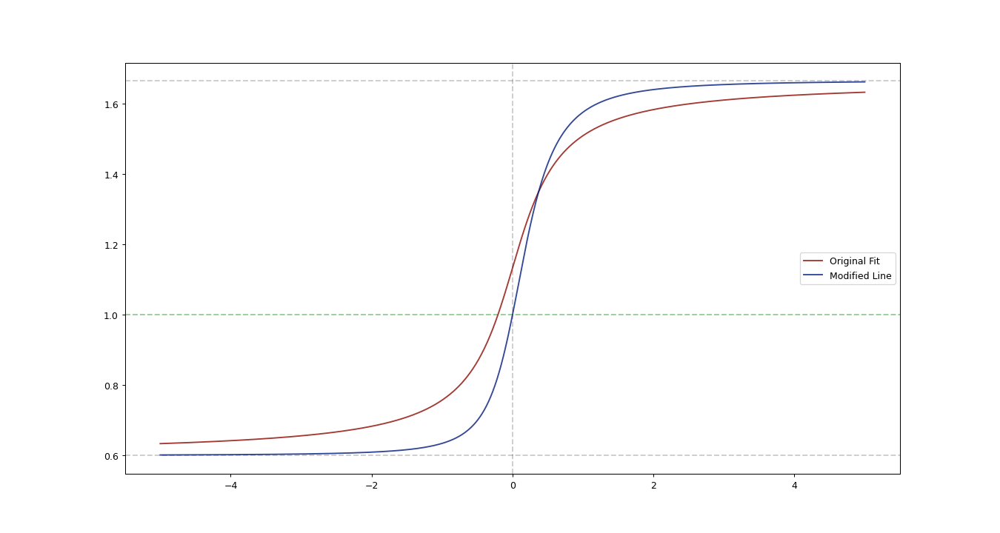

In [271]:
alpha = 2
B_y0  = 0
B_xz  = 1

x = np.linspace(-5, 5, 1001)
y = contrast(x, alpha, B_y0, B_xz)
y2 = (5/3 + 3/5)/2 + ((5/3 - 3/5)/2)*2/np.pi*np.arctan((x * alpha + B_y0) / B_xz)



plt.figure(figsize=(15,8))
plt.plot(x, y2, c='C2', alpha=0.8, label="Original Fit")
plt.plot(x, y, c='C0', alpha=0.8, label="Modified Line")
plt.axvline(x=0, c='k', ls='--', alpha=0.2)
plt.axhline(y=1, c='g', ls='--', alpha=0.4)
plt.axhline(y=5/3, c='k', ls='--', alpha=0.2)
plt.axhline(y=3/5, c='k', ls='--', alpha=0.2)
plt.legend()

plt.show()


## Gaussian Optics - Calculating Zeeman Optics Positioning

In [331]:
def foc_point(f1, f2, d):
    """    
        Computes the distance between the second lens, and the final focal point of the two lens system.
        f1: focal length of the first lens
        f2: focal length of the second lens
        d: distance between them 
    """
    F = -1 / (1/f1 + 1/f2 - d/(f1*f2)) # Focal point - but this is from a certain point P inbetween the two lenses - this is delta away from the second lens
    delta = -d * F/f1
    dist = F - delta
    print(f"For {d=}, {F=}")
    return dist



<IPython.core.display.Javascript object>


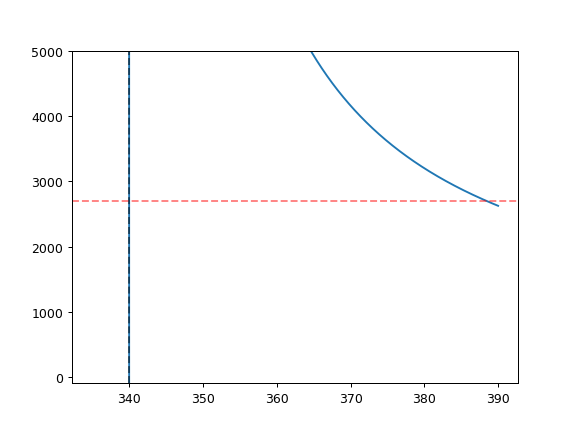

For d=array([335.        , 335.01833945, 335.03667889, ..., 389.96332111,
       389.98166055, 390.        ]), F=array([-1280.        , -1284.71218206, -1289.4591871 , ...,
         128.0939669 ,   128.04696621,   128.        ])


In [332]:
plt.style.use('default')

f1 = 20 
f2 = 320 

d = np.linspace(f1+f2-5, f1+f2+50, 3000)

plt.figure()
plt.plot(d, foc_point(f1, f2, d))
plt.axhline(y=2700, ls='--', c='r', alpha=0.5)
plt.axvline(x=340, c='k', ls='--', alpha=0.5)
plt.ylim([-100, 5000])
plt.show()



# Other

### AI Helper 

In [ ]:
# Get all the comments
# date = 20231211
path = "/storage/BECViewer/comments/"
# def get_comment(date, shot):
#     file1 = open(f'/storage/BECViewer/comments/{date}_{str(shot).zfill(4)}.txt', 'r')
#     return float(file1.read())

import os
allcomsfromdate = []
for file in os.listdir(path):
    if file.endswith(".txt"):
#         if file[:8] == str(date):
            allcomsfromdate.append([str(file), open(os.path.join(path, file), 'r').read()])

allcomsfromdate = sorted(allcomsfromdate)  

In [36]:
# Make a csv file with all the experimental parameters, and all the fitted results. Then save this csv file and upload it to ChatGPT's GPTs 

|Date, shot, analysis, all_parameters, all_fitted|

In [37]:
import csv

with open('/home/bec_lab/Desktop/all_data.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    field = ["name", "age", "country"]
    
    writer.writerow(field)
    writer.writerow(["Oladele Damilola", "40", "Nigeria"])
    writer.writerow(["Alina Hricko", "23", "Ukraine"])
    writer.writerow(["Isabel Walter", "50", "United Kingdom"])